# **AI Art Detector**
`Raden Dissa Shafira`

# I. Introduction

**Background:**

The rapid advancement of artificial intelligence (AI) has not only transformed various industries but has also found its way into the `realm of art`. AI-generated art, created using algorithms and machine learning techniques, has gained significant attention and popularity in recent years. However, this rise in AI art has also raised concerns within the art community and the design industry about the `authenticity` and originality of these creations. In the art community, as well in the design industry, the soul of art holds crucial matters. Art is not only about its final outcome or visual representation--rather, brings depths and meaning to our creatives efforts. 

Other than originality, AI-generated "art: also holds frustration among artist whose works are used to `train the machine models`. This issue goes beyond questioning the "authenticity of an art" as it delves more to ethical considerations in the use of an artist's work without proper attribute and disregard artists' intelectual property. In a way, the sentiment is more like an `aim towards "art-theft"` rather than denying the "potential of technology" or depicting fears of robot "stealing our jobs". 

To address this challenge, we aim to develop a Convolutional Neural Network (CNN) model to detect AI-generated art. This would be particularly valuable in various domains, including cases of art competitions, concept designs, and the design industry as a whole where originality holds significant importance. Even can help AI artists themselves in evaluating the authenticity of artworks. It provides a meaning to look at the evolving landscape of art. By integrating this technology, the art community and the design industry can adapt to the changing dynamics and explore new opportunities for collaboration and artistic expression.

**Problem Statement:**

The emergence of AI-generated art presents a unique challenge for the art community and the design industry. We aim to develop a Convolutional Neural Network (CNN) model to detect AI-generated art. By training the model on a dataset consisting of both AI-generated and human-made artworks, we can leverage the power of deep learning algorithms to identify patterns and features that distinguish between the two types of art. The model would be useful for art curators, design industry, as well as other domains that may value these aspects for any cause. 

**Dataset:**

Dataset used is the dataset from [HuggingFace AI or Not Competitions](https://huggingface.co/datasets/competitions/aiornot) which was commited on January 25th. Although it is not very recent, an open source dataset for this topic hasn't yet been widely circulated yet (creating datasets like this comes down to artists' permissions) and is by far the most varied dataset we could find. The dataset consists of 18557 images for training, labeled '0' for human-made/ real-life photographs and '1' for AI-generated art/ images. 

**Disclamer:**

We acknowledge that the perception of what is "real" and what is not ultimately lies in the eyes of the beholder. Please note that while our AI art detection model can be a valuable assist, it is should not be the sole determinant of artistic authenticity. It is meant to be used as a tool to gain a richer understanding and appreciation of art in its various forms. Lastly, while we do fight towards artists' rights, we also believe in a world where different forms of creativity can `coexist`.

# II. Import Libraries
Contains all the libraries needed in the project. 

In [1]:
# Math and visualization
import random
import glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# image filter
import cv2
from scipy.ndimage import gaussian_filter
from torchvision.transforms import ColorJitter

# tf model
import tensorflow as tf
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.models import Model
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
from tensorflow.keras.layers import Dense, Dropout, Conv2D, MaxPooling2D, Flatten, Input
from tensorflow.keras.applications.xception import Xception # transfer learning

# Evaluation
from sklearn.metrics import accuracy_score, classification_report, ConfusionMatrixDisplay, confusion_matrix


# save model & inferencing
from tensorflow.keras.models import load_model

# other
import os
import warnings
warnings.filterwarnings('ignore')

# III. Data Loading
This section contains loading data as well as checking the amount of data, data content, data size, and so on to find out which parts have the potential to be investigated.

In [16]:
# Download data from the source
# terminal: kaggle datasets download -d derrickmwiti/aidata

# define path towards downloaded dataset
train_path = r'C:\Users\Dissa Shafira\Hacktiv8_main\Phase 2 Milestone 2\aidata\train' 
test_path = r'C:\Users\Dissa Shafira\Hacktiv8_main\Phase 2 Milestone 2\aidata\test' 
os.listdir(train_path)

['0', '1']

In [15]:
# print the total of each datasets category
def check_dir(dir=None, labels=None):
  for label in labels:
    num_data = len(os.listdir(os.path.join(dir, label)))
    label_name = "Human-made" if label == '0' else "AI-generated"
    print(f'Total Amount {label_name}: {num_data}')

print('TRAIN SET:')
check_dir(train_path, ['0', '1'])

print('\nTEST SET:')
check_dir(test_path, ['0', '1'])

TRAIN SET:
Total Amount Human-made: 8256
Total Amount AI-generated: 10301

TEST SET:
Total Amount Human-made: 32
Total Amount AI-generated: 29


From the information above we know that our target label are named '0' (for human-made/real-life photographs) and '1' for AI-generated art. We also known about our datasets shape. Overall, when comparing both categories within each dataset, we observe a fairly good balance.

# IV. EDA



In this section, our focus will be on exploring the dataset and understanding its correlation with the target classification. Specifically, we will delve into the realm of art and discuss various techniques for analyzing artworks using human perception. To guide our analysis, we have identified the following key targets:

- Main rule/ principle.
- Composition.
- Value Composition.
- Colors and/ or other values.

We will try to generalize and gain conclusion towards analyzing the data both manually and with the help of using some tools to help us filter out, `reduce them to their essence`, and find some hidden meanings. 

**Take samples**

In [31]:
# define paths to each categories
train_human= glob.glob(train_path + '/0/*.jpg')
train_ai= glob.glob(train_path + '/1/*.jpg')

test_human= glob.glob(test_path + '/0/*.jpg')
test_ai= glob.glob(test_path + '/1/*.jpg')

train_human[:3]

['C:\\Users\\Dissa Shafira\\Hacktiv8_main\\Phase 2 Milestone 2\\aidata\\train/0\\10060.jpg',
 'C:\\Users\\Dissa Shafira\\Hacktiv8_main\\Phase 2 Milestone 2\\aidata\\train/0\\10064.jpg',
 'C:\\Users\\Dissa Shafira\\Hacktiv8_main\\Phase 2 Milestone 2\\aidata\\train/0\\10065.jpg']

In [344]:
# make function to take out random samples
def random_sample(image_files, num_samples=10):
  random_files= random.sample(image_files, num_samples)
  return random_files

# define random samples
random_train_human= random_sample(train_human)
random_train_ai= random_sample(train_ai)

In [683]:
# samples takenrandom_train_ai

['C:\\Users\\Dissa Shafira\\Hacktiv8_main\\Phase 2 Milestone 2\\aidata\\train/1\\8415.jpg',
 'C:\\Users\\Dissa Shafira\\Hacktiv8_main\\Phase 2 Milestone 2\\aidata\\train/1\\453.jpg',
 'C:\\Users\\Dissa Shafira\\Hacktiv8_main\\Phase 2 Milestone 2\\aidata\\train/1\\2316.jpg',
 'C:\\Users\\Dissa Shafira\\Hacktiv8_main\\Phase 2 Milestone 2\\aidata\\train/1\\1318.jpg',
 'C:\\Users\\Dissa Shafira\\Hacktiv8_main\\Phase 2 Milestone 2\\aidata\\train/1\\6564.jpg',
 'C:\\Users\\Dissa Shafira\\Hacktiv8_main\\Phase 2 Milestone 2\\aidata\\train/1\\14862.jpg',
 'C:\\Users\\Dissa Shafira\\Hacktiv8_main\\Phase 2 Milestone 2\\aidata\\train/1\\13386.jpg',
 'C:\\Users\\Dissa Shafira\\Hacktiv8_main\\Phase 2 Milestone 2\\aidata\\train/1\\10690.jpg',
 'C:\\Users\\Dissa Shafira\\Hacktiv8_main\\Phase 2 Milestone 2\\aidata\\train/1\\670.jpg',
 'C:\\Users\\Dissa Shafira\\Hacktiv8_main\\Phase 2 Milestone 2\\aidata\\train/1\\2160.jpg']

In [341]:
# take one samples out to see the shapes
img = plt.imread('C:\\Users\\Dissa Shafira\\Hacktiv8_main\\Phase 2 Milestone 2\\aidata\\train/0\\10064.jpg')
print(img.shape)

(512, 512, 3)


The images in our dataset are square with dimensions of 512 x 512 pixels and are in color, represented by 3 channels (RGB). It is important to take this into consideration when resizing the images because we might want to maintain the original ratio. 

**Define all filter functions**

In [820]:
# visualize image
def visualize_img(random_data, labels=None):
    '''
    use this function to visualize data just as is. 
    random_data is a list of image path
    list contains 10 path
    '''
    fig, axes = plt.subplots(2, 5, figsize=(20, 7))
    
    for i, image_path in enumerate(random_data):
        row = i // 5  # calculate the row index
        col = i % 5   # Cclculate the column index
        
        image = plt.imread(image_path)
        axes[row, col].imshow(image, cmap='gray') 
        axes[row, col].set_title(f'{labels}, {image.shape}')
        axes[row, col].axis('off')
    
    plt.show()


# blur and black and white
def visualize_blur(random_data, labels=None):
    '''
    use this function to visualize data and giving black and white + blur filter
    '''
    fig, axes = plt.subplots(2, 5, figsize=(20, 7))
    for i, image_path in enumerate(random_data):
        row = i // 5  # calculate row index
        col = i % 5   # calculate column index
        
        image = plt.imread(image_path)
        blurred_image = gaussian_filter(image, sigma=5)  # apply gaussian blur with sigma value
        
        axes[row, col].imshow(blurred_image, cmap='gray')
        axes[row, col].set_title(f'{labels}, {image.shape}')
        axes[row, col].axis('off')
    
    plt.show()


def visualize_color_jitter(random_data, labels=None):
    color_jitter = ColorJitter(brightness=0.4, contrast=0.4, saturation=0.4, hue=0.1)
    fig, axes = plt.subplots(2, 5, figsize=(20, 7))
    
    for i, image_path in enumerate(random_data):
        row = i // 5  # Calculate the row index
        col = i % 5   # Calculate the column index
        
        image = plt.imread(image_path)
        jittered_image = color_jitter(Image.fromarray(image))
        
        axes[row, col].imshow(jittered_image)
        axes[row, col].set_title(f'{labels}, {image.shape}')
        axes[row, col].axis('off')
    
    plt.show()


# change hue and saturation
def visualize_hue(samples):
    fig, ax = plt.subplots(nrows=2, ncols=5, figsize=(20, 7))
    for i, sample in enumerate(samples):
        img = cv2.imread(sample)
        img_hue = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)  
        row = i // 5
        col = i % 5
        if row < 2 and col < 5:
            ax[row, col].set_title(sample.split('/')[-1].split('\\')[-1])
            ax[row, col].imshow(img_hue)
    plt.show()


def visualize_luv(samples):
    fig, ax = plt.subplots(nrows=2, ncols=5, figsize=(20, 7))
    for i, sample in enumerate(samples):
        img = cv2.imread(sample)
        img_luv = cv2.cvtColor(img, cv2.COLOR_BGR2LUV)  # Convert to LUV color space
        row = i // 5
        col = i % 5
        if row < 2 and col < 5:
            ax[row, col].set_title(sample.split('/')[-1].split('\\')[0])
            ax[row, col].imshow(img_luv)
    plt.show()    

# to visualise ony 3 data
def visualize_3(random_data, labels=None):
    fig, axes= plt.subplots(1,3, figsize=(15,12))
    for i, image_path in enumerate(random_data):
        image= plt.imread(image_path)
        axes[i].imshow(image, cmap='gray') 
        axes[i].set_title(f'{labels}')
        axes[i].axis('off')
    plt.show()

# to visualise ony 5 data
def visualize_5(random_data, labels=None):
    fig, axes= plt.subplots(1,5, figsize=(15,12))
    for i, image_path in enumerate(random_data):
        image= plt.imread(image_path)
        axes[i].imshow(image, cmap='gray') 
        axes[i].set_title(f'{labels}')
        axes[i].axis('off')
    plt.show()

    

### General description

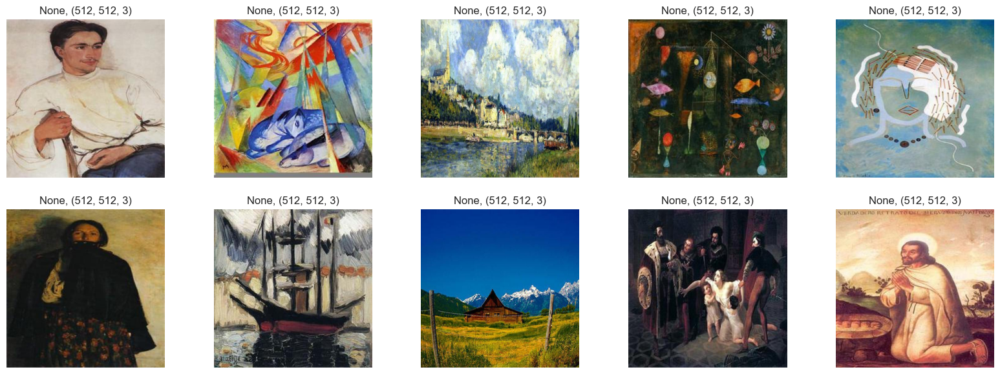

In [695]:
# perform function
visualize_img(random_train_human)

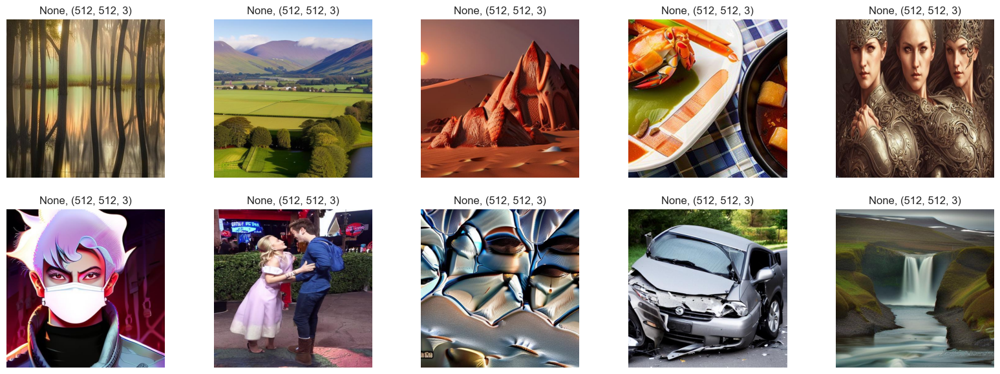

In [696]:
# perform function
visualize_img(random_train_ai)

Here, a fair amount of samples of each human-made and AI-generated images has been extracted. On the human-made data, we see some images that looks like realistic paintings, abstract paintings, surreal paintings, and landscape painting. 
On the AI-generated set, we can see that we have some landscape paintings, realistic human, cartoon human, surreal images, and object pictures. 

- Aesthetic period: Usually, artist a copyright protection from an artwork would expire 70 years afer the artist's had passed (source: [johnsflaherty.com](https://www.johnsflaherty.com/blog/public-domain-can-i-use-da-vinci-painting-in-upcoming-ad-campaign2#:~:text=Although%20there%20was%20no%20copyright,is%20in%20the%20public%20domain.)). This means that the works and photographs shown in the "human-made" section are either `old paintings, traditional drawings, free stocks, artworks of consented artist, and other public domain art`. While there is a presence of digital art, the majority of the art created in this context is focused on traditional drawing techniques. 
We can note that this would cause some bias to the model, since AI-generated art (especially the ones we are going to try after the model is deployed) will have a much more contemporary looking art and is still producing and developing till this day. This might cause bias that the model might tend to take "modern-looking" images as AI and the other one around for human-made. We need to keep this hypothesis and talk about it on the later stage.
- Smear: AI-generated pictures often exhibit `smearing`, which results in a loss of color vibrancy. When colors are blended together, they tend to become dull and `appear greyish`. This effect can occur when images are digitally distorted or manipulated in ways that cause the colors to mix inappropriately. As a result, some random parts of the image may lack clarity and definition.
- AI-generated art can sometimes feature alienated objects, where the objects or elements within the image appear disconnected or disjointed. This effect arises due to the way AI algorithms interpret and generate images, often incorporating elements that may not align with conventional artistic composition or human perception. While for human art, even if they want to make a surreal art, then everything on the canvas will have a rule to make it blend. 
- AI-generated art frequently displays an off-centered composition, where the main subject or focal point of the image is not centrally positioned. This departure from traditional composition principles could be attributed to the unique nature of AI algorithms, which may not follow the same aesthetic guidelines as human artists. Consequently, the composition may appear unconventional or unbalanced.
- AI-generated pictures tend to exhibit higher saturation and contrast levels compared to real-life colors. Since AI algorithms generate images based on modified computer data rather than real-world observations, they can introduce exaggerated colors and enhanced contrasts.

On the next steps, we will put some filters to see the potential of hidden layers that cannot be seen by human eyes alone. 

### Value & Object Composition

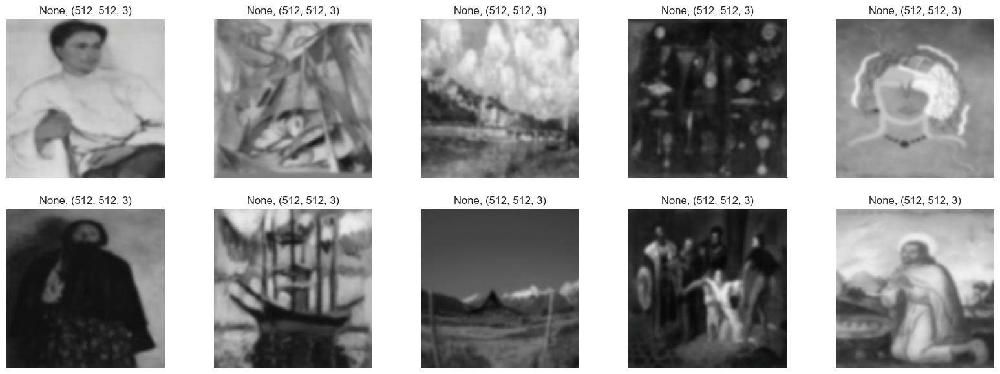

In [697]:
# perform function to turn monochrome
visualize_blur(random_train_human)

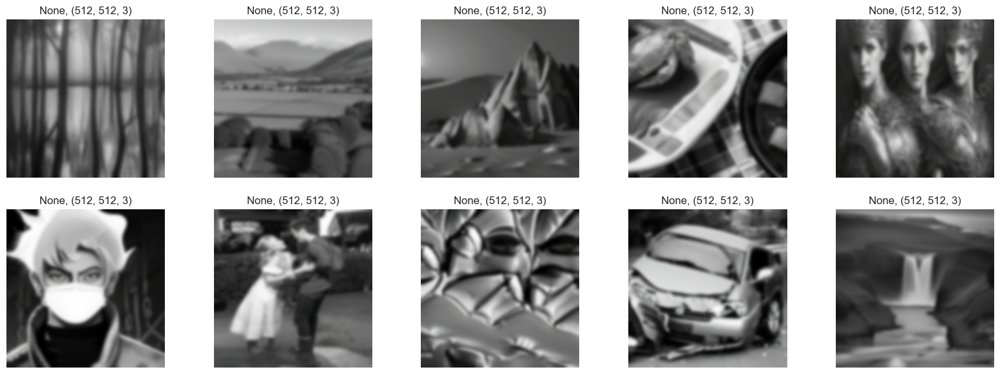

In [698]:
# perform function to turn monochrome
visualize_blur(random_train_ai)

AI-generated images often do not pay close attention to the composition of values ('values' here means shade of light. Usually can be seen easier if we turn the image to black and white). The focus of AI-generated art tends to be on other factors such as percentages, ratios, and the arrangement of contrasts, which play a significant role in creating visually appealing paintings. These factors can result in a wide range of contrast levels, varying from highly contrasting to low contrast, depending on the desired art style. On the other hand, human-made art often follows "established rules and principles" that determine how values (shades of lightness and darkness) are arranged in the composition.

### Composition

Similar to the exploration above, we will continue the composition topic with some simple manual exploration about the 'rule and principle'. Here, we are using simple [gestalt principles](https://en.wikipedia.org/wiki/Gestalt_psychology) as the base anatomy principle. 


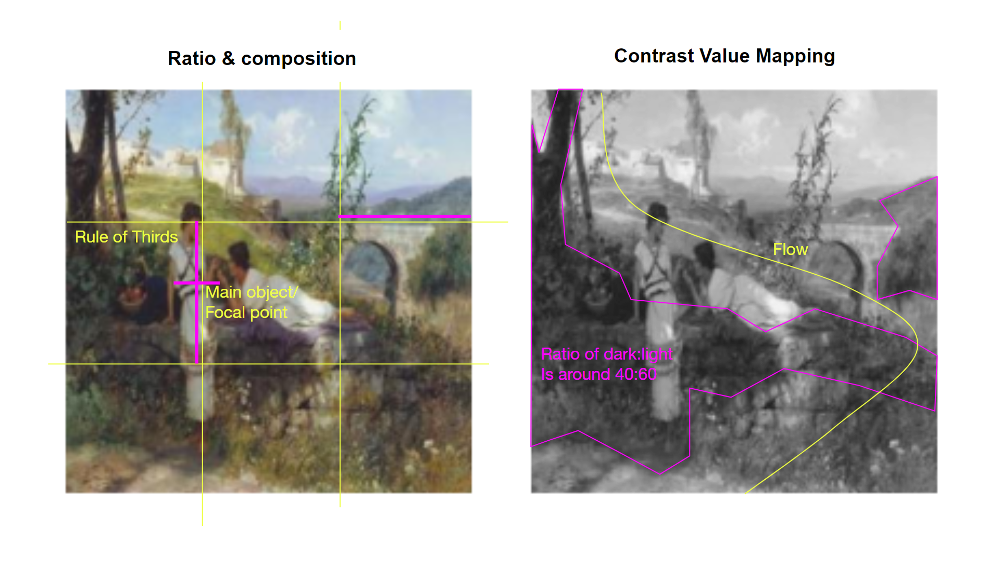

Here we can observe some noticeable patterns when we apply simple guidelines. Even in abstract art, upon closer inspection, there are often underlying rules that contribute to a well-balanced composition (see more examples at: [the-art-of-composition.com](https://www.the-art-of-composition.com/the-art-of-composition.html)). However, it is important to note that these observations are not 100% conclusive as we do not have information about the specific artists in our training dataset.


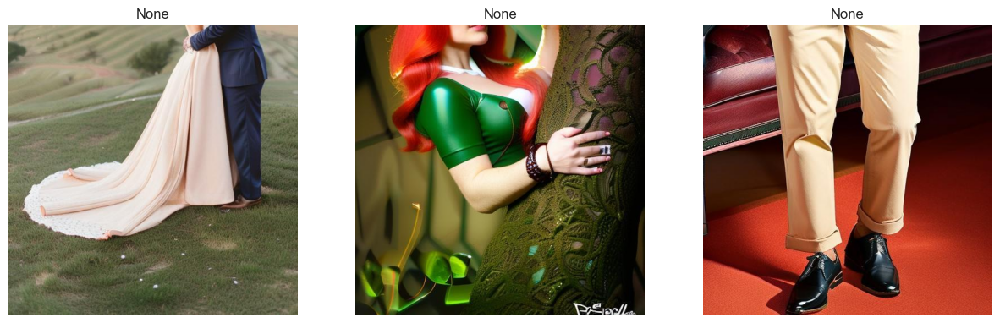

In [714]:
# take more samples
ai_samples =  ["C:\\Users\\Dissa Shafira\\Hacktiv8_main\\Phase 2 Milestone 2\\DEPLOYMENT\\ai-or-human\\1179.jpg",
    "C:\\Users\\Dissa Shafira\\Hacktiv8_main\\Phase 2 Milestone 2\\DEPLOYMENT\\ai-or-human\\1184.jpg",
    "C:\\Users\\Dissa Shafira\\Hacktiv8_main\\Phase 2 Milestone 2\\DEPLOYMENT\\ai-or-human\\1241.jpg",]
visualize_3(ai_samples)


On the other hand, AI-generated images often exhibit poor cropping and composition. While this characteristic may not apply to all AI-generated images, off-centered compositions and a lack of focal points can indicate artificial generation. It is similar to how we assess the height and weight of a canvas and identify significant points to define an `object boundaries`.

### Saturation

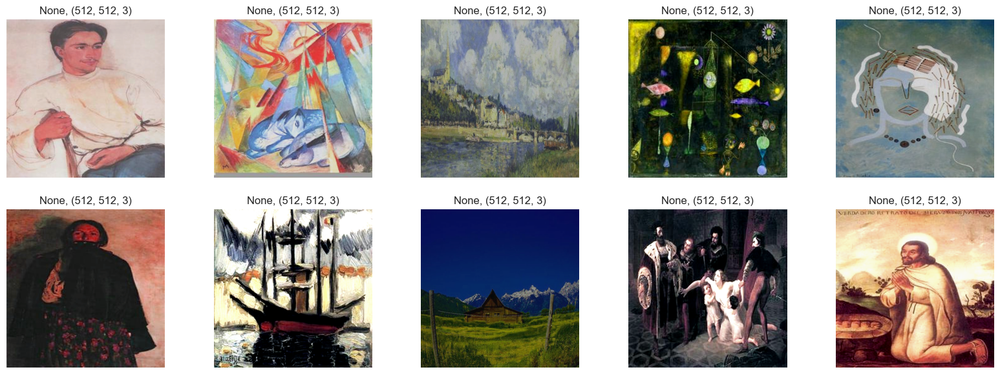

In [699]:
# perform function to random saturate
visualize_color_jitter(random_train_human)

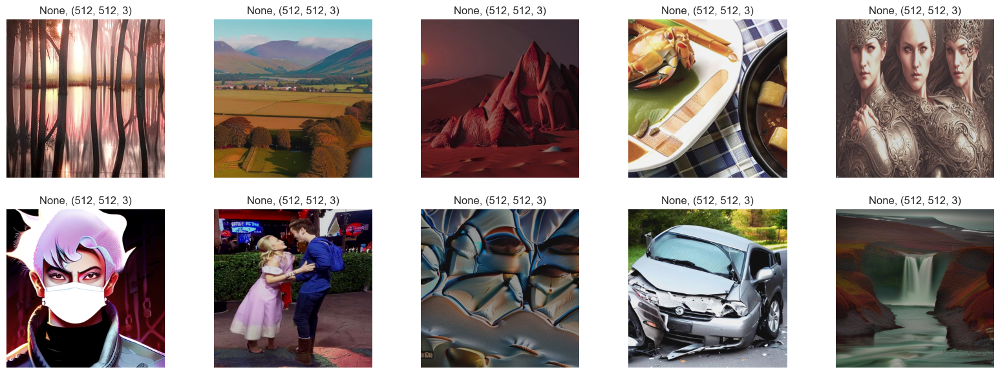

In [700]:
# perform function to random saturate
visualize_color_jitter(random_train_ai)

AI-generated images are typically robust to saturation adjustments--where the human-made looks like a different pieces of work when saturation and brightness are applied. This may be attributed to the fact that AI-generated data utilizes a `wider range of colors` available in the RGB spectrum, which is specifically designed for display on computer monitors. On the other hand, human-made images often appear less vibrant as they are `limited to real-life colors` that may not be as vivid or intense.

For example, when we use traditional paint, the colors we choose are typically available within the computer's color palette as well. However, if we were to print a neon green color that appears vibrant on a computer monitor, it might not be reproduced exactly the same on paper. This discrepancy occurs because real-life colors are limited by the capabilities of physical mediums like printers, which may not be able to reproduce certain intense or vivid colors with the same accuracy as digital displays. Therefore, there can be variations between the colors we perceive on a screen and the colors that are achievable in physical form.

### Extreme hue and saturation

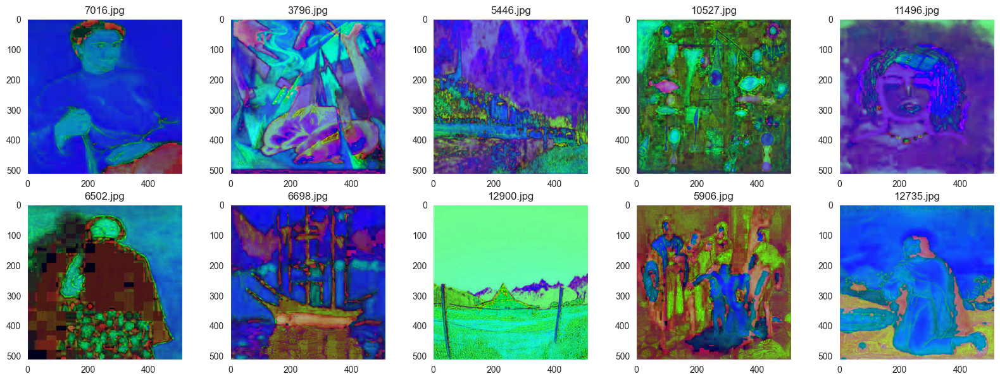

In [701]:
# perform function to change the hue and put extreme saturation
visualize_hue(random_train_human)

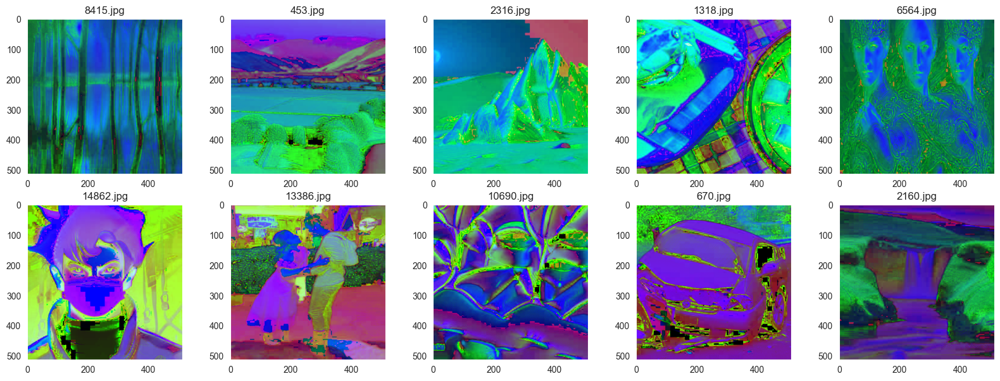

In [702]:
# perform function to change the hue and put extreme saturation
visualize_hue(random_train_ai)

As for hue and saturation change, we haven't find a significant difference yet, but we do know that AI-generated images will exhibit a wider range of colors--as seen in the vibrant neon green and pink hues produced. In contrast, human art tends to have a relatively lower color saturation, reflecting the limitations of the real world in reproducing certain colors.

### Luminance factors

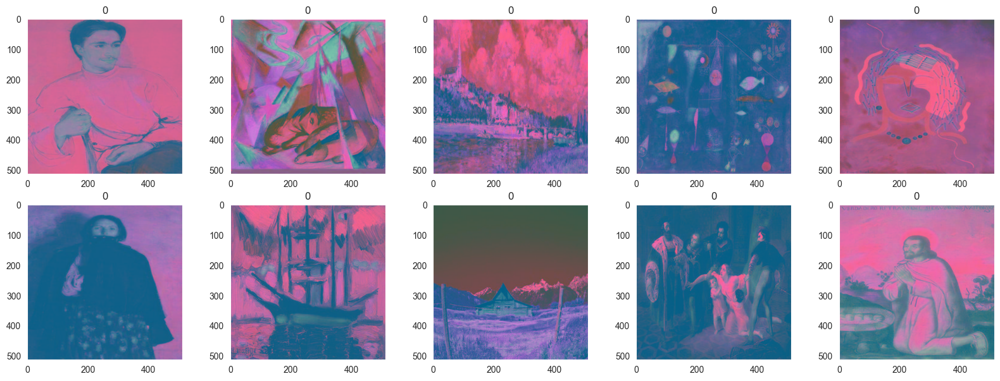

In [707]:
# perform function to lowe luminance
visualize_luv(random_train_human)

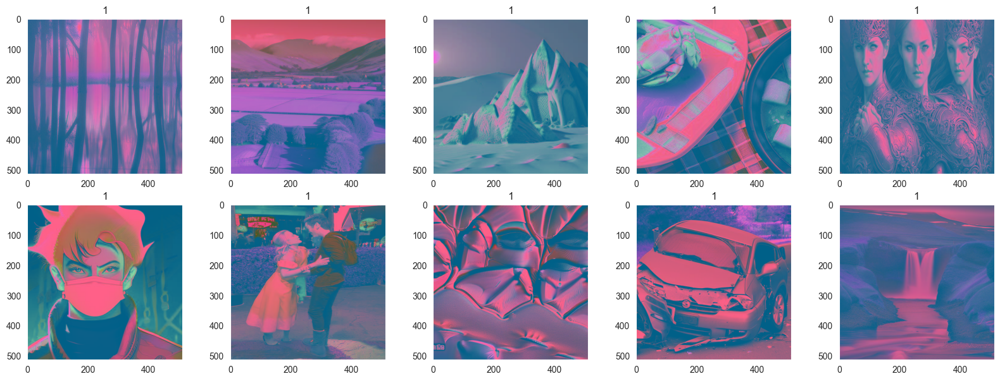

In [708]:
# perform function to lower luminance
visualize_luv(random_train_ai)

This filter reduces the luminance of the image, resulting in both categories appearing paler and softer on a similar level. Therefore, there is no significant difference between the two categories found at this stage.

### Conclusion

- It is important to note that the images observed in this analysis are based on the dataset compiled up until January 2023, and it is possible that AI-generated art has further advanced since then.
- In terms of style, traditional human-made art tends to be `either` realistic or abstract looking. In contrast, AI-generated art often combines both styles, incorporating noises and creating unique and unconventional images. Sometimes producing alienated objects that is different from the whole canvas' aesthetic.
- Colors: Hue (which color used like red, green, blue) does not play a significant role. However, saturation does play a significant role as AI-generated images tend to have a broader color palette that may not be present in traditional drawings. 
- AI art often lacks centered composition and a clear focal point, distinguishing it from traditional art forms.



This exploration section is still very subjective. We conducted explorations to uncover the essence of AI-generated art--an interpretation beyond naked-eyes perception--and to understand what the computer is capable of visualizing. We extracted these images, reducing them to their fundamental forms and transforming them through various techniques. 

However, it remains uncertain whether the computer can perceive images in the same way we do. Nevertheless, we can experiment our model by implementing different types of augmentations to observe if they yield any improvements or insights.

# V. Feature Engineering

Since we consider our dataset to be quite big, we will consider some pre-processing steps:
- Reducing the image height and width to 128x128 (from (512, 512, 3)) for memory efficiency. If it affect the model in the later part, we will consider on increasing the size for improvement
- Set batch_size to 500 for (potentially) faster learning and smother updates. 

In [81]:
# set image sizes for training
img_height= 128
img_width= 128
batch_size= 500

As stated before, we will split the train set into two parts. We will conduct a 70:30 split for train and validation; this way, this split provides a larger portion of data for training while still allowing a reasonable amount for model evaluation.

In [387]:
# take data from directory into a dataset form
train_ds = tf.keras.preprocessing.image_dataset_from_directory(
    train_path,
    validation_split= 0.3,
    subset='training',
    seed=66,
    image_size=(img_height,img_width),
    batch_size= batch_size
)


Found 18557 files belonging to 2 classes.
Using 12990 files for training.


In [388]:
# take data from directory into a dataset form
val_ds = tf.keras.preprocessing.image_dataset_from_directory(
    train_path,
    validation_split= 0.3, # split 0.3 for validation and test
    subset='validation',
    seed=66,
    image_size=(img_height,img_width),
    batch_size= batch_size,
    shuffle=False
)

Found 18557 files belonging to 2 classes.
Using 5567 files for validation.


In [373]:
# take data from directory into a dataset form
test_ds = tf.keras.preprocessing.image_dataset_from_directory(
    test_path,
    seed=66,
    image_size=(img_height,img_width),
    batch_size= batch_size,
    shuffle=False
)

Found 61 files belonging to 2 classes.


After this, we are going to turn the test set into a dataframe for later evaluation. 

In [602]:
# define  function
def get_image_paths(directory):
    image_paths = []
    '''function to get each category's image paths'''
    for filename in os.listdir(directory):
        full_path = os.path.join(directory, filename)
        if os.path.isfile(full_path) and any(full_path.endswith(extension) for extension in ['.jpg', '.png', '.jpeg']):
            image_paths.append(full_path)

    return image_paths

# specify directory
directory_ai = test_path + '\\1'
directory_human = test_path + '\\0'

# get image paths for each image
image_paths_ai = get_image_paths(directory_ai)
image_paths_human = get_image_paths(directory_human)

# print to see the list
print(image_paths_ai)
print(image_paths_human)

['C:\\Users\\Dissa Shafira\\Hacktiv8_main\\Phase 2 Milestone 2\\aidata\\test\\1\\0.jpg', 'C:\\Users\\Dissa Shafira\\Hacktiv8_main\\Phase 2 Milestone 2\\aidata\\test\\1\\1.jpg', 'C:\\Users\\Dissa Shafira\\Hacktiv8_main\\Phase 2 Milestone 2\\aidata\\test\\1\\10.jpg', 'C:\\Users\\Dissa Shafira\\Hacktiv8_main\\Phase 2 Milestone 2\\aidata\\test\\1\\10001.jpg', 'C:\\Users\\Dissa Shafira\\Hacktiv8_main\\Phase 2 Milestone 2\\aidata\\test\\1\\10002.jpg', 'C:\\Users\\Dissa Shafira\\Hacktiv8_main\\Phase 2 Milestone 2\\aidata\\test\\1\\10004.jpg', 'C:\\Users\\Dissa Shafira\\Hacktiv8_main\\Phase 2 Milestone 2\\aidata\\test\\1\\10005.jpg', 'C:\\Users\\Dissa Shafira\\Hacktiv8_main\\Phase 2 Milestone 2\\aidata\\test\\1\\10006.jpg', 'C:\\Users\\Dissa Shafira\\Hacktiv8_main\\Phase 2 Milestone 2\\aidata\\test\\1\\10007.jpg', 'C:\\Users\\Dissa Shafira\\Hacktiv8_main\\Phase 2 Milestone 2\\aidata\\test\\1\\10008.jpg', 'C:\\Users\\Dissa Shafira\\Hacktiv8_main\\Phase 2 Milestone 2\\aidata\\test\\1\\10009.jpg'

In [606]:
# Create a DataFrame from the image paths list
df_ai = pd.DataFrame(image_paths_ai, columns=['id'])
df_human = pd.DataFrame(image_paths_human, columns=['id'])
# Add a label column with all values set to 1
df_ai['label'] = 1
df_human['label'] = 0

In [608]:
# concat both categories
concatenated_df = pd.concat([df_human, df_ai], ignore_index=True)

In [717]:
#print test set
concatenated_df.head(3)

,id,label
0,C:\Users\Dissa Shafira\Hacktiv8_main\Phase 2 M...,0
1,C:\Users\Dissa Shafira\Hacktiv8_main\Phase 2 M...,0
2,C:\Users\Dissa Shafira\Hacktiv8_main\Phase 2 M...,0


# VI. Modelling

### Definition

We are going to use Convolutional Neural Network (CNN) for detecting AI art and human art in an image classification task. CNNs are well-suited for image analysis and have been used for various image classification tasks, including distinguishing between different types of art (see more at: [CNN to Recognise Art Style](https://medium.com/@lavallee.alexx/how-to-code-a-convolutional-neural-networks-to-recognise-art-style-in-paintings-d922fe69e553)). However, we do acknowledge that using cnn to detect AI-generated art might still be `experimental`. CNNs are particularly effective for image classification because they can automatically learn and extract relevant features directly from the input images. Heres what we know about how it works:

1. Convolutional Layers: CNNs are composed of multiple convolutional layers that apply a set of learnable filters  to the input image. These filters help capture `local patterns and features`; such as edges, textures, and shapes. The filters are learned during the training process, allowing the CNN to adapt to the specific task at hand.

2. Pooling Layers: After each convolutional layer, pooling layers are typically employed to `reduce the dimensions` of the feature maps while retaining the most relevant information. 

3. Fully Connected Layers: The output from the last pooling layer is `flattened into a vector` and put into one or more fully connected layers. These layers perform high-level reasoning and make predictions based on the learned features.

CNNs are capable of learning and detecting various visual features, including brush strokes, color palettes, etc., as long as those features are `discriminative enough to differentiate`. The CNN learns to recognize patterns and structures at different levels of abstraction. For example, in the early layers, the CNN may learn low-level features like edges and textures, while in the deeper layers, it can learn higher-level features like shapes and object compositions. By providing a large and diverse dataset of AI art and human art images, we assume the CNN can learn to associate specific visual hints and features within each class.

**Acknowledgemet:**

It's important to note that while CNNs can learn visual features, their performance in this regard depends on the `availability and quality of data`. From our data analysis, we have known that our data is limited in terms of styles. We might consider a different approach, such as using Generative Adversarial Network (GAN)--since the process of generating the 'art' itself is bu using a generative model. We might even consider the combination of both and other related studies where it will undergo some procedure; `hypothetically`, we can use the discriminator part of a generative model (that distinguish real and generated data) as a feature extractor that learns to identify and distinguish features in the input data. By utilizing the discriminator's feature extraction capabilities, we can extract and understand what is the `meaningful features` that *they* see, then we can put the extracted features into a separate machine learning model for prediction.

However in this case, we will try to explore the project using CNN model alone. That means the model will primarily focus on analyzing the composition of the images and learning features that are indicated AI art or human art, **`visually`** (brush strokes, color palettes, edges, etc)--not, for instance, actually detecting some "artificial" **`behaviour`** present in the data. Knowing this, we will conduct several trials and errors using the sequential model, augmented data, as well as transfer learning to improve the model and achieve the best possible result.


(source: [Towards Data Science: Simple Introduction to CNN](https://towardsdatascience.com/simple-introduction-to-convolutional-neural-networks-cdf8d3077bac),
[Inquirer Technology: Identify AI art](https://technology.inquirer.net/121074/how-to-identify-ai-art), [McacDonald, Kylie on medium: How to Recognize Fake AI-Generated Images](https://kcimc.medium.com/how-to-recognize-fake-ai-generated-images-4d1f6f9a2842), [becominghuman.ai on medium: Generating Famous Works using CNNs and GANs](https://becominghuman.ai/the-intersection-of-art-and-ai-identifying-and-generating-famous-works-using-cnns-and-gans-22f3f583353)




### Pre-process

We prepare by forming a `tensorflow pipeline`. In this pipeline, there are several things that we manage, namely:
- Batch has already defined.
- Not using repeat to avoid overfitting. 
- Setting buffer_size to AUTOTUNE to allow TensorFlow to dynamically adjust the buffer size.
- Use shuffle: Even though our images set are not sequential and doesn't have a correlation/ theme to the images that comes after, we still consider using shuffle to introduce randomness to the training process and reduce any potential bias or patterns that may exist in the dataset (even though the images doesn't have any detected sequence, the order of loading the data might birthed something in common. For example, the generated images could have used similar prompts for the first sets of data, or that the first 100 images were generated using the same AI model with specific art styles, and any other patterns that may go undetected).

In [495]:
# define pipeline
AUTOTUNE = tf.data.AUTOTUNE
train_ds_pipe = train_ds.cache().prefetch(buffer_size=AUTOTUNE).shuffle(len(train_ds))
val_ds_pipe = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

## 1) Transfer Learning - Xception

We will try to use transfer leaning model Xception to hopefully get a better model result. Here are some of the arguments in using Xception:
- Depth and complexity: Xception can capture distinct features and patterns, assuming it can differenciate AI and human art this way. 
- Known for high performance in image classification tasks.
- Can still be fine-tuned, saving training time and improving generalization.
- Lighter model: For our personal case, this transfer learning model runs fastest compared ResNet50, VGG19, and other architecture that we have previously explored but are not included in the notebook. 


### Model Definition

Explanation behind the architecture:

- Turn the tranfer model's "trainable" to false to freeze the model and prevent the weights from being updated during training. 
- Turn our input shape into 128 x 128 x 3, for reason as stated on the feature engineering part. 
- Hidden layer: Using only one hidden layer since we are using transferred model, and the transferred model is already complex.
- The Hidden layer contains 128 neurons. 128 was chosen for moderate complexity. While too many neurons would be too complex and might be time consuming, less neurons might higher the risk of model being undefit. Also since the data is pretty abstract, we consider 128 as high enough to allow the model to learn and capture more relationships in the data provided. It is also known that our activation size would have `128 x 128 x 3 (based on our input) = 49,152 features`, and choosing 128 neurons might allow `dimensionality reduction` while still retaining information.
- Using relu and HeNormal in hidden layer to introduce non-linearity to the model.
- Using sigmoid activation for binary classification
- Using loss binary_crossentropy for binary classification. 
- Using adam as the optimizer for its adaptivity. Adam is also more popular and is widely used, so we consider them a good choice for experimental exploration.  
- Adding three other metrics other than loss, such as Binary Accuracy, Recall, and Precision to get a better understanding of the models evaluation.
- Setting the threshold to 0.60 since we want out model to be sensitive towards false positives. This threshold may lead to a higher recall (ability to detect positives, that is the AI-generated images). It will only predict the class when it is very confident, which reduces the chances of missing true positives.

(source: [Towards Data Science: Understanding and Calculating the number of Parameters](https://towardsdatascience.com/understanding-and-calculating-the-number-of-parameters-in-convolution-neural-networks-cnns-fc88790d530d), [Towards Data Science: CNN](https://towardsdatascience.com/covolutional-neural-network-cb0883dd6529))

In [731]:
# define inputs
inputs= (img_height, img_width,3)

In [158]:
# import Xception model
pretrained_model = tf.keras.applications.Xception(include_top=False, 
                                                  input_shape=inputs,pooling='avg')
pretrained_model.trainable = False

# define model
model_xep= Sequential()
model_xep.add(pretrained_model) # added trained model

# fully connected layer
model_xep.add(Flatten())
model_xep.add(Dense(128, activation='relu')),
model_xep.add(Dense(units=1,activation='sigmoid'))
# compile 
model_xep.compile(optimizer='adam', loss='binary_crossentropy',
              metrics=[tf.keras.metrics.BinaryAccuracy(threshold = .6), tf.keras.metrics.Recall(), tf.keras.metrics.Precision()]) # using 3 metrics

83683744/83683744 [==============================] - 16s 0us/step


In [721]:
# looking at model summary
model_xep.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 xception (Functional)       (None, 2048)              20861480  
                                                                 
 flatten_2 (Flatten)         (None, 2048)              0         
                                                                 
 dense_4 (Dense)             (None, 128)               262272    
                                                                 
 dense_5 (Dense)             (None, 1)                 129       
                                                                 
Total params: 21,123,881
Trainable params: 262,401
Non-trainable params: 20,861,480
_________________________________________________________________


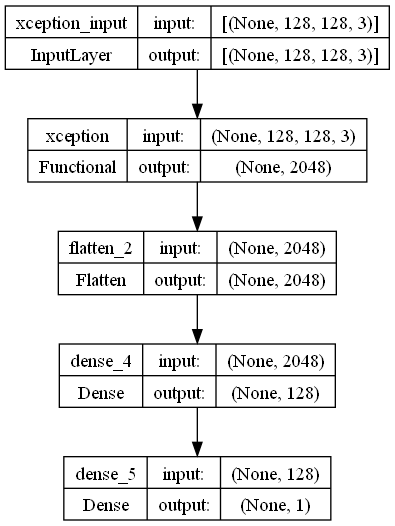

In [722]:
# plot layers
tf.keras.utils.plot_model(model_xep, show_shapes = True)

In [159]:
# train and put result to a variable
history_xep= model_xep.fit(
    train_ds_pipe,
    validation_data= val_ds_pipe,
    epochs=epochs,
    callbacks = cb_esmc)

Epoch 1/10
26/26 [==============================] - 346s 13s/step - loss: 2.0243 - binary_accuracy: 0.6509 - recall_2: 0.7075 - precision_2: 0.6810 - val_loss: 0.7912 - val_binary_accuracy: 0.6944 - val_recall_2: 0.6639 - val_precision_2: 0.7772
Epoch 2/10
26/26 [==============================] - 315s 12s/step - loss: 0.6862 - binary_accuracy: 0.7139 - recall_2: 0.7632 - precision_2: 0.7417 - val_loss: 0.5638 - val_binary_accuracy: 0.7574 - val_recall_2: 0.8164 - val_precision_2: 0.7604
Epoch 3/10
26/26 [==============================] - 337s 13s/step - loss: 0.5672 - binary_accuracy: 0.7514 - recall_2: 0.7922 - precision_2: 0.7715 - val_loss: 0.4935 - val_binary_accuracy: 0.7844 - val_recall_2: 0.8359 - val_precision_2: 0.7828
Epoch 4/10
26/26 [==============================] - 333s 13s/step - loss: 0.4932 - binary_accuracy: 0.7788 - recall_2: 0.8135 - precision_2: 0.7966 - val_loss: 0.4544 - val_binary_accuracy: 0.7885 - val_recall_2: 0.8010 - val_precision_2: 0.8287
Epoch 5/10
26/26

The learning process is quite long, around 5-6 minutes per epoch. Lets see its evaluation.

### Model Evaluation

In [160]:
# create dataframe out of training history
history_xep_df = pd.DataFrame(history_xep.history)
# look through the lasts histories
history_xep_df.tail(5)

,loss,binary_accuracy,recall_2,precision_2,val_loss,val_binary_accuracy,val_recall_2,val_precision_2
5,0.442223,0.801617,0.832174,0.812059,0.407380,0.822479,0.864180,0.820994
6,0.439902,0.803156,0.831895,0.820590,0.394977,0.823711,0.843724,0.839518
7,0.401568,0.817321,0.843167,0.838500,0.394097,0.830331,0.905093,0.801183
8,0.402775,0.818784,0.848177,0.830608,0.372777,0.834257,0.877540,0.830392
9,0.367398,0.834026,0.857501,0.852164,0.361319,0.847960,0.923045,0.805073


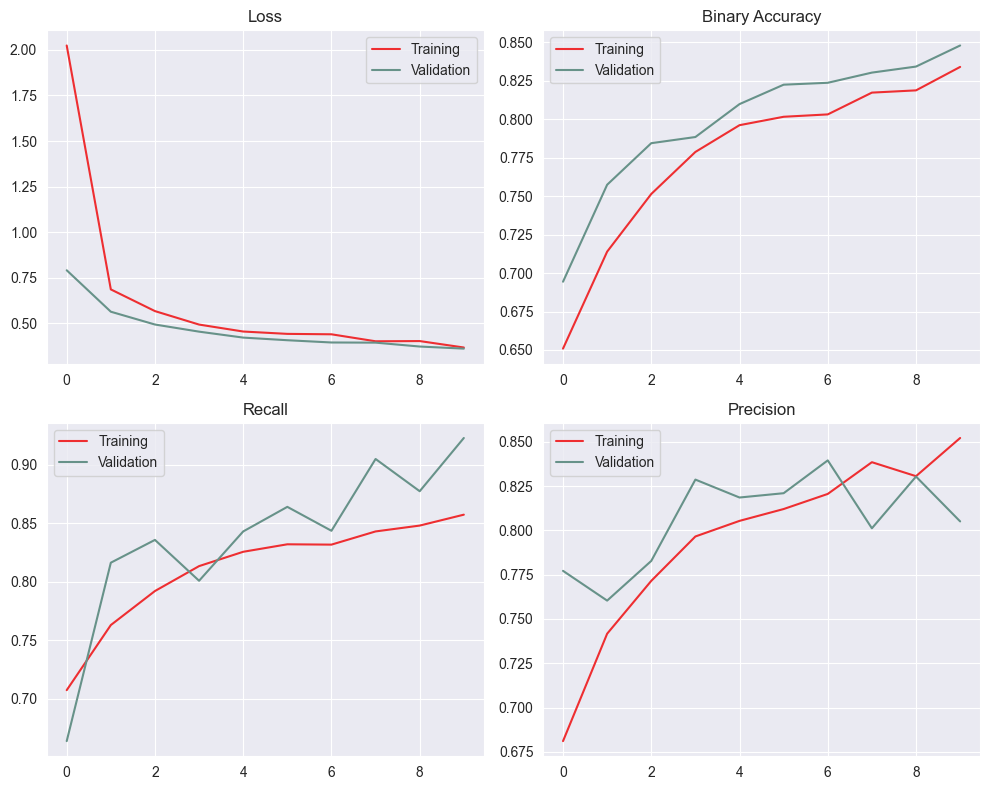

In [165]:
# making 2 by 2 canvas
sns.set_style({'axes.grid': True}) # using grid for better and easier visual
sns.set_style('darkgrid')
fig, axes = plt.subplots(2, 2, figsize=(10, 8))

# loss
axes[0, 0].plot(history_xep_df['loss'], color = '#ee2e31')
axes[0, 0].plot(history_xep_df['val_loss'], color = '#679289')
axes[0, 0].set_title('Loss')
axes[0, 0].legend(['Training', 'Validation'])

# binary accuracy
axes[0, 1].plot(history_xep_df['binary_accuracy'],color = '#ee2e31')
axes[0, 1].plot(history_xep_df['val_binary_accuracy'],color = '#679289')
axes[0, 1].set_title('Binary Accuracy')
axes[0, 1].legend(['Training', 'Validation'])

# Recall
axes[1, 0].plot(history_xep_df['recall_2'],color = '#ee2e31')
axes[1, 0].plot(history_xep_df['val_recall_2'],color = '#679289')
axes[1, 0].set_title('Recall')
axes[1, 0].legend(['Training', 'Validation'])

# Precision
axes[1, 1].plot(history_xep_df['precision_2'],color = '#ee2e31')
axes[1, 1].plot(history_xep_df['val_precision_2'],color = '#679289')
axes[1, 1].set_title('Precision')
axes[1, 1].legend(['Training', 'Validation'])

# show plot
plt.tight_layout()
plt.show()

In [726]:
# evaluation
test_results_xep = model_xep.evaluate(test_ds, verbose=0)
print(f'Test Loss     : {test_results_xep[0]:.4f}')
print(f'Test Accuracy : {test_results_xep[1]:.4f}')

Test Loss     : 0.6812
Test Accuracy : 0.7377


In [725]:
# see its classification report
y_pred_trf = model_xep.predict(test_ds)
y_pred_trf_fix = np.where(y_pred_trf >=0.6, 1,0 )
print(classification_report(concatenated_df.label, y_pred_trf_fix))

1/1 [==============================] - 5s 5s/step
              precision    recall  f1-score   support

           0       0.79      0.69      0.73        32
           1       0.70      0.79      0.74        29

    accuracy                           0.74        61
   macro avg       0.74      0.74      0.74        61
weighted avg       0.74      0.74      0.74        61



Based on the evaluation, it appears that the model we have trained has a tendency to :
- Took a long time to train (that is also why we set it to 10 epochs) with the latest metrics around 80%
- Fit the data well but does not achieve a high accuracy score, with only 73% accuracy on the test set.
- Still can go further to reach the lowest loss.
- Gradient of loss is pretty smooth with no exploding or vanishing gradient. 
- Have a pretty good recall score on category '1' (AI-Generated) which may be the cause of our 0.6 threshold. Though instead, we got a pretty bad score on other metrics.  

Some possible actions we can do to improve the model's score and performance could be by increasing the number of epochs or further tuning the model, since we have only did 10 epochs for this model. However, even if it would provide high accuracy at some exact iteration, but by considering the `time-consuming tendencies` of the transfer learning process, it might not be worth continuing to explore this model.  

Additionally, it's important to note that the assumptions made out of this model's characteristic may not be the best fit for our specific project in classifying AI-art afterall. As of now, we have decided to scrap this idea. Nevertheless, we have explored the possibilities and gained valuable insights from the experiment.

## 2) Sequential - Augmented Data

In this part we will try to experiment with transforming the data. In this part, we will try some image augmentation tuning with this consideration:
- Not using zoom: Based on the EDA section, we have already determined that one of our category, AI-generated images often exhibit off-centeredness and random object placement. Therefore, we will avoid utilizing the zoom parameter to prevent these from influencing the model.
- Not using shear: Similarly, it is known that AI-generated art frequently contains random smears that result in object distortion. Applying shear to all of our training data may introduce a bias, potentially misclassifying human-made art as AI-generated. Hence, we will exclude the shear transformation to maintain model accuracy.
- Emphasizing contrast and brightness: Our exploration suggests that color saturation and value are crucial features in distinguishing between AI-generated and human-made art. Therefore, we will primarily focus on manipulating contrast and brightness during the preprocessing stage to enhance the visibility of these important attributes.



On a note, we also did try out some other augmentations such as shift range, and the ones stated below:
```       
layers.RandomFlip("horizontal", input_shape=(img_height, img_width, 3))
layers.RandomRotation(0.1)
layers.RandomZoom(0.1)
layers.RandomTranslation(height_factor=0.1, width_factor=0.1)
```
But it didn't give us satisfactory result in the model training. We will then proceed to the next step using the arguments stated as above.

In [482]:
# define augmentation
data_augmentation = keras.Sequential([
        layers.RandomContrast([0.3,0.3], seed=None), # numbers to define upper lower bound, how contrast you want it to be
        layers.RandomBrightness([0.3,0.3], seed=None), # define upper lower bound
    ])

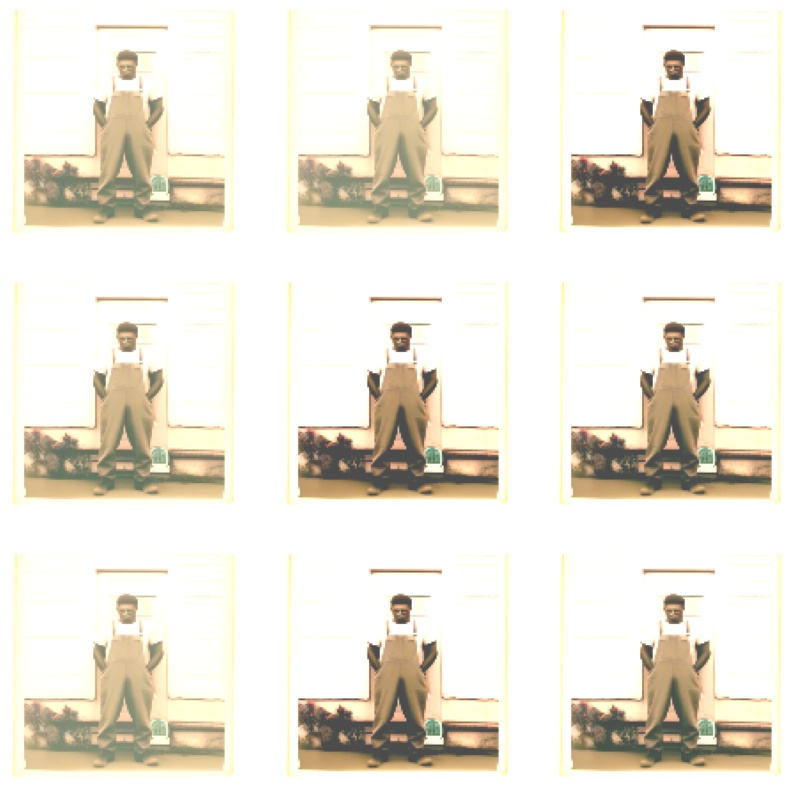

In [790]:
# Visualise augmentation result
plt.figure(figsize=(10,10))
for images, _ in train_ds.take(1):
  for i in range(9):
    augmented_img= data_augmentation(images)
    ax=plt.subplot(3, 3, i +1)
    plt.imshow(augmented_img[0].numpy().astype('uint8'))
    plt.axis('off')

### Model Definition

Explanation behind the architecture:

- Neurons: The consideration of the number of neurons remains the same as in the previous model.
- First Conv: Using convolutional layer with 16 filters and and a filter size of 3x3. `Starting with a lower number of filters` allows the model to learn relatively simpler and more generic patterns in the earlier layers. These features can include edges, corners, and basic shapes.
- Second Conv: Using 32 filter with the size of 3x3. Increasing the number of filters enables the model to learn more complex and higher-level patterns/ features.
- Inserting MaxPool inbetween convolutional layers to reduce spatial dimensions (selecting maximum value/ presumably the most important features only). We used default parameter which is 2x2 pool size. By applying smaller pool size, we aim to downsample the spatial dimensions of the feature maps, enabling the model to focus on the `most relevant and distinctive features`. This can also (hypothetically) help in reducing overfitting.
- Input shape, activation used, optimizer used, and metrics are used for the same reason as the prior model.
- Using 0.6 threshold to maximize recall score. 
- Adding dropout in assumption to normalize and prevent overfitting. 

(source: [stackexchange.com: why increase number of filters](https://datascience.stackexchange.com/questions/55545/in-cnn-why-do-we-increase-the-number-of-filters-in-deeper-convolution-layers-fo))

In [483]:
# clear session
tf.keras.backend.clear_session()

In [484]:
# define model
model_aug = Sequential([
    data_augmentation, # added augmentation result
    layers.Rescaling(1./255, input_shape=inputs),
    layers.Conv2D(16 ,3 , padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(32 ,3 , padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Dropout(0.2), # added dropout for normalization
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dense(units=1, activation='sigmoid')
])

In [485]:
# compile and define metrics and optimizer
model_aug.compile(optimizer='adam', loss='binary_crossentropy',
              metrics=[tf.keras.metrics.BinaryAccuracy(threshold = .6), tf.keras.metrics.Recall(), tf.keras.metrics.Precision()])

In [487]:
# build to visualise and see summary
model_aug.build(input_shape=(None, img_height, img_width, 3))

# print the model summary
model_aug.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential (Sequential)     (None, 128, 128, 3)       0         
                                                                 
 rescaling (Rescaling)       (None, 128, 128, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 128, 128, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 64, 64, 16)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 64, 64, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 32, 32, 32)       0         
 2D)                                                    

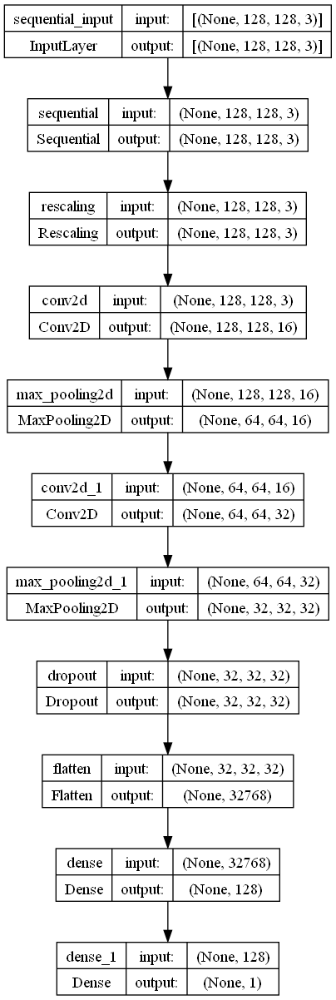

In [723]:
# plot layers
tf.keras.utils.plot_model(model_aug, show_shapes = True)

In [500]:
# define callbacks
cb_esmc = [
    EarlyStopping(monitor='val_loss', patience= 6),
    ModelCheckpoint('best_model_ai.hdf5', monitor='val_loss', save_best_only=True)
]

In [724]:
# Train the model using augmented images
epochs= 20
history_aug = model_aug.fit(
    train_ds_pipe,
    validation_data= val_ds_pipe,
    epochs=epochs,
    callbacks = cb_esmc)

Epoch 1/20
26/26 [==============================] - 119s 4s/step - loss: 0.4010 - binary_accuracy: 0.8550 - recall: 0.8091 - precision: 0.9150 - val_loss: 0.1089 - val_binary_accuracy: 0.8933 - val_recall: 0.9307 - val_precision: 1.0000
Epoch 2/20
26/26 [==============================] - 110s 4s/step - loss: 0.3955 - binary_accuracy: 0.8553 - recall: 0.7970 - precision: 0.9332 - val_loss: 0.2016 - val_binary_accuracy: 0.7706 - val_recall: 0.8046 - val_precision: 1.0000
Epoch 3/20
26/26 [==============================] - 112s 4s/step - loss: 0.4024 - binary_accuracy: 0.8430 - recall: 0.7707 - precision: 0.9348 - val_loss: 0.1512 - val_binary_accuracy: 0.8495 - val_recall: 0.9118 - val_precision: 1.0000
Epoch 4/20
26/26 [==============================] - 112s 4s/step - loss: 0.3954 - binary_accuracy: 0.8527 - recall: 0.7929 - precision: 0.9177 - val_loss: 0.1703 - val_binary_accuracy: 0.8135 - val_recall: 0.8516 - val_precision: 1.0000
Epoch 5/20
26/26 [==============================] - 

The model efficiently stopped at 7 epochs using early stopping callbacks based on the val_loss.

### Model Evaluation

In [727]:
# create dataframe out of training history
history_aug_df = pd.DataFrame(history_aug.history)
# look through the lasts histories
history_aug_df.tail(5)

,loss,binary_accuracy,recall,precision,val_loss,val_binary_accuracy,val_recall,val_precision
2,0.402408,0.843033,0.770665,0.934841,0.151198,0.849470,0.911802,1.0
3,0.395389,0.852733,0.792931,0.917700,0.170271,0.813544,0.851626,1.0
4,0.385482,0.856890,0.803507,0.930540,0.126852,0.875337,0.920065,1.0
5,0.378249,0.863818,0.812135,0.930040,0.113056,0.895815,0.934974,1.0
6,0.379779,0.855889,0.784024,0.955077,0.115496,0.899946,0.938926,1.0


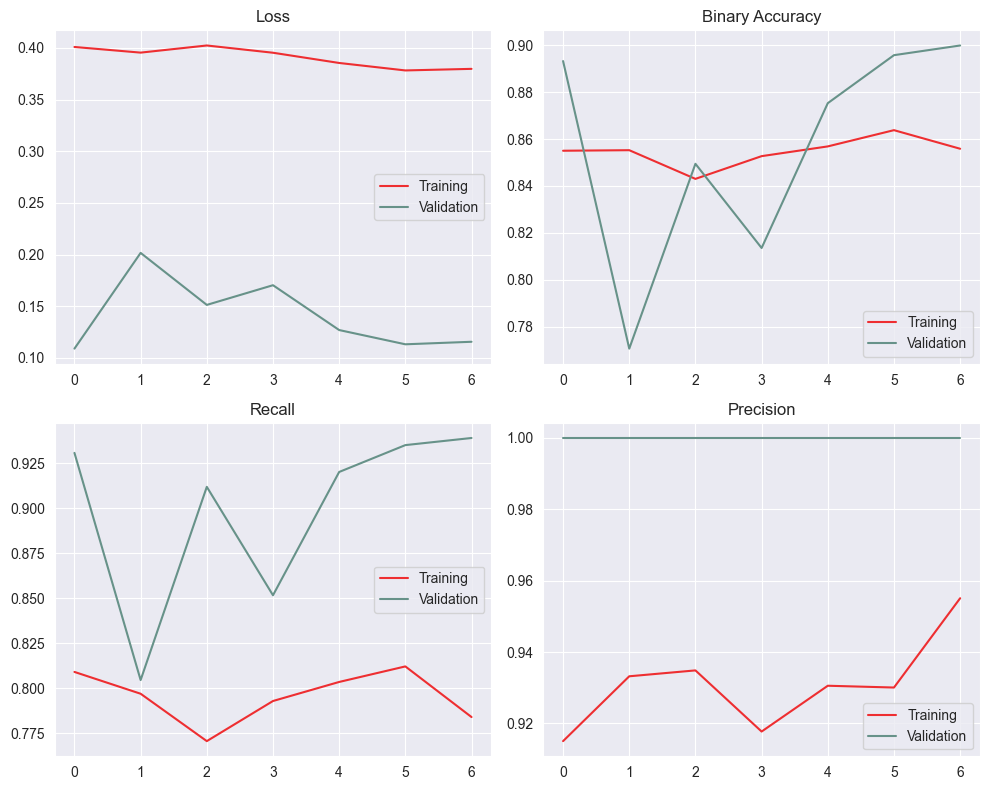

In [728]:
# making 2 by 2 canvas
sns.set_style({'axes.grid': True}) # using grid for better and easier visual
sns.set_style('darkgrid')
fig, axes = plt.subplots(2, 2, figsize=(10, 8))

# loss
axes[0, 0].plot(history_aug_df['loss'], color = '#ee2e31')
axes[0, 0].plot(history_aug_df['val_loss'], color = '#679289')
axes[0, 0].set_title('Loss')
axes[0, 0].legend(['Training', 'Validation'])

# binary accuracy
axes[0, 1].plot(history_aug_df['binary_accuracy'],color = '#ee2e31')
axes[0, 1].plot(history_aug_df['val_binary_accuracy'],color = '#679289')
axes[0, 1].set_title('Binary Accuracy')
axes[0, 1].legend(['Training', 'Validation'])

# Recall
axes[1, 0].plot(history_aug_df['recall'],color = '#ee2e31')
axes[1, 0].plot(history_aug_df['val_recall'],color = '#679289')
axes[1, 0].set_title('Recall')
axes[1, 0].legend(['Training', 'Validation'])

# Precision
axes[1, 1].plot(history_aug_df['precision'],color = '#ee2e31')
axes[1, 1].plot(history_aug_df['val_precision'],color = '#679289')
axes[1, 1].set_title('Precision')
axes[1, 1].legend(['Training', 'Validation'])

# show plot
plt.tight_layout()
plt.show()

In [729]:
# see test result
test_results_aug = model_aug.evaluate(test_ds, verbose=0)
print(f'Test Loss     : {test_results_aug[0]:.4f}')
print(f'Test Accuracy : {test_results_aug[1]:.4f}')

Test Loss     : 0.6282
Test Accuracy : 0.7541


In [730]:
# see its classification report
y_pred_aug = model_aug.predict(test_ds)
y_pred_aug_fix = np.where(y_pred_aug >=0.6, 1,0 )
print(classification_report(concatenated_df.label, y_pred_aug_fix))

1/1 [==============================] - 6s 6s/step
              precision    recall  f1-score   support

           0       0.81      0.69      0.75        32
           1       0.71      0.83      0.76        29

    accuracy                           0.75        61
   macro avg       0.76      0.76      0.75        61
weighted avg       0.76      0.75      0.75        61



Based on the evaluation, it appears that the model we have trained has a tendency to :
- Took around 100-120 seconds per epoch to train.
- The model tends to `overfit`, despite having added dropout in the earlier model definition.
- Have a train binary accuracy of 85%, and test accuracy of 75%. 
- val_loss gradient is a bit exploding. 
- Have a the highest recall score of 83% on category '1' (AI-Generated) which may be the cause of our 0.6 threshold. Though as a result, we got a pretty bad score on other metrics.  

All in all, the augmentation experiment failed for some predictable reasons: manipulating the data transforms the images into something different. This transformation may lead to the loss of artistic features and result in incorrect assumptions.

Based on these information, lets try to evaluate the next model by:
- `Reducing` either architecture, augmentation, or other added optimizer that has added the complexity of the model's architecture.
- Try adding BatchNormalization to try to normalize the exploding gradient seen. 
- Try default model.

## 3) Sequential

### Model Definition

Explanation behind the architecture:

- Neurons: The consideration of the number of neurons remains the same as in the previous model.
- The consideration for convolutional layer are still the same as the previous model.
- Input shape, activation used, optimizer used, and metrics are used for the same reason as the prior model.
- Using 0.6 threshold to maximize recall score. 
- Adding BatchNormalization in assumption to improve gradient flow. We will try to put one BatchNormalization right before the output layer. 

In [733]:
# clear session
tf.keras.backend.clear_session()

In [660]:
# define sequential model
model_imp = Sequential([
    layers.Rescaling(1./255, input_shape=inputs),
    layers.Conv2D(16, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.BatchNormalization(), # added batch normalization
    layers.Dense(units=1, activation='sigmoid')
])

model_imp.compile(optimizer='adam', loss='binary_crossentropy',
            metrics = [tf.keras.metrics.BinaryAccuracy(threshold = .6), tf.keras.metrics.Recall(), tf.keras.metrics.Precision()]) 

In [734]:
# looking at model summary
model_imp.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, 128, 128, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 128, 128, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 64, 64, 16)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 64, 64, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 32, 32, 32)       0         
 2D)                                                             
                                                                 
 flatten (Flatten)           (None, 32768)             0

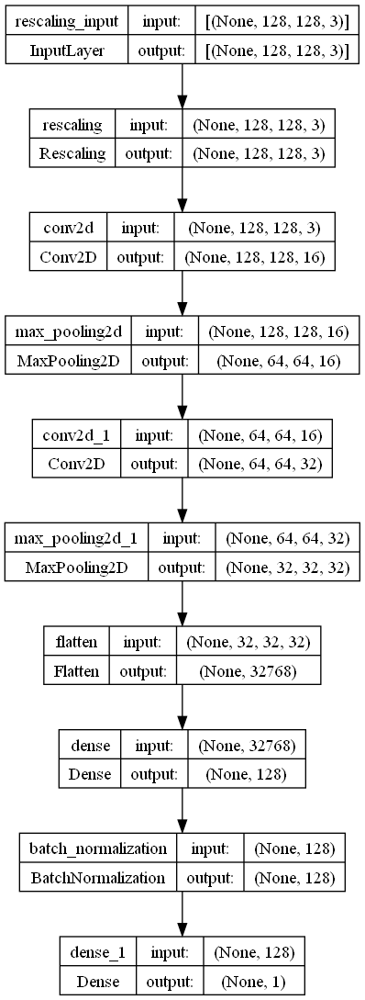

In [735]:
# plot layers
tf.keras.utils.plot_model(model_imp, show_shapes = True)

In [661]:
# train the model
epochs= 15
history_imp= model_imp.fit(
    train_ds_pipe,
    validation_data= val_ds_pipe,
    epochs=epochs,
)

Epoch 1/15
26/26 [==============================] - 78s 3s/step - loss: 0.4421 - binary_accuracy: 0.7849 - recall: 0.7186 - precision: 0.9045 - val_loss: 0.0533 - val_binary_accuracy: 0.9722 - val_recall: 0.9853 - val_precision: 1.0000
Epoch 2/15
26/26 [==============================] - 73s 3s/step - loss: 0.3234 - binary_accuracy: 0.8500 - recall: 0.7913 - precision: 0.9542 - val_loss: 0.1317 - val_binary_accuracy: 0.9150 - val_recall: 0.9492 - val_precision: 1.0000
Epoch 3/15
26/26 [==============================] - 73s 3s/step - loss: 0.2586 - binary_accuracy: 0.8824 - recall: 0.8496 - precision: 0.9481 - val_loss: 0.3048 - val_binary_accuracy: 0.7938 - val_recall: 0.8552 - val_precision: 1.0000
Epoch 4/15
26/26 [==============================] - 72s 3s/step - loss: 0.2032 - binary_accuracy: 0.9119 - recall: 0.8958 - precision: 0.9553 - val_loss: 0.2218 - val_binary_accuracy: 0.8728 - val_recall: 0.9353 - val_precision: 1.0000
Epoch 5/15
26/26 [==============================] - 69s 

### Model Evaluation

In [662]:
# create dataframe out of training history
history_imp_df = pd.DataFrame(history_imp.history)
# look through the lasts histories
history_imp_df.tail(5)

,loss,binary_accuracy,recall,precision,val_loss,val_binary_accuracy,val_recall,val_precision
10,0.023334,0.995381,0.995964,0.998048,0.016581,0.995689,0.997485,1.0
11,0.015365,0.997998,0.998052,0.998886,0.024892,0.992635,0.995150,1.0
12,0.012198,0.998537,0.998608,0.998886,0.041828,0.983115,0.988683,1.0
13,0.008926,0.999076,0.999165,0.999722,0.015080,0.994252,0.995330,1.0
14,0.004829,0.999923,1.000000,0.999861,0.024551,0.990480,0.992276,1.0


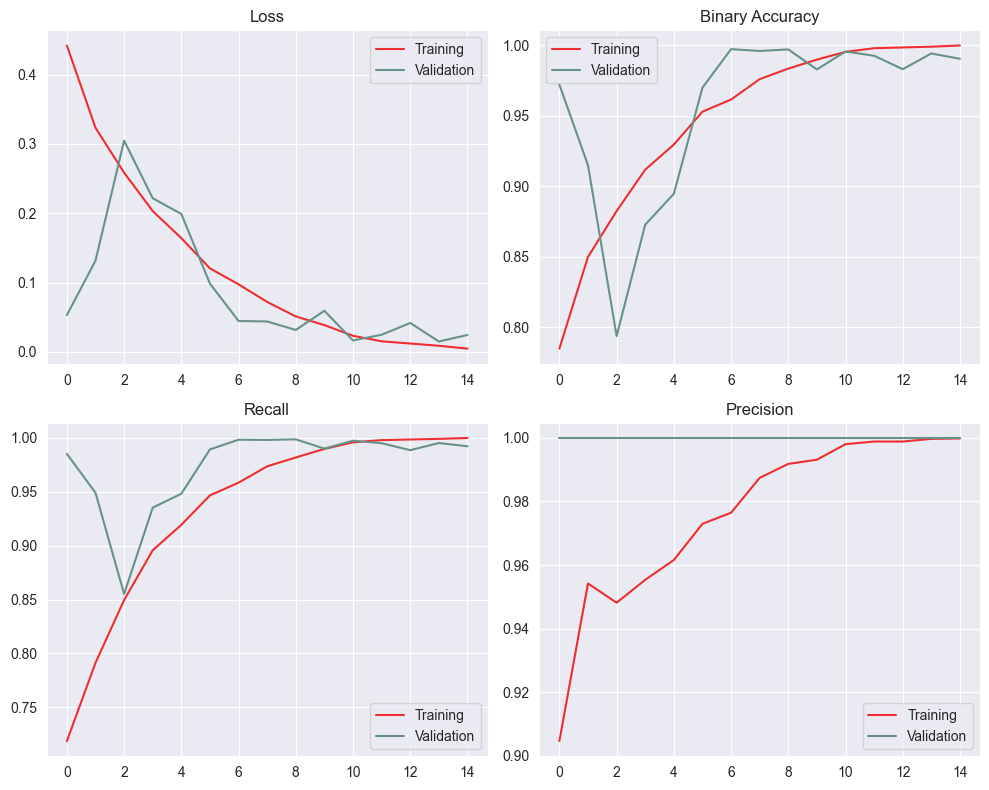

In [663]:
# making 2 by 2 canvas
sns.set_style({'axes.grid': True}) # using grid for better and easier visual
sns.set_style('darkgrid')
fig, axes = plt.subplots(2, 2, figsize=(10, 8))

# loss
axes[0, 0].plot(history_imp_df['loss'], color = '#ee2e31')
axes[0, 0].plot(history_imp_df['val_loss'], color = '#679289')
axes[0, 0].set_title('Loss')
axes[0, 0].legend(['Training', 'Validation'])

# binary accuracy
axes[0, 1].plot(history_imp_df['binary_accuracy'],color = '#ee2e31')
axes[0, 1].plot(history_imp_df['val_binary_accuracy'],color = '#679289')
axes[0, 1].set_title('Binary Accuracy')
axes[0, 1].legend(['Training', 'Validation'])

# Recall
axes[1, 0].plot(history_imp_df['recall'],color = '#ee2e31')
axes[1, 0].plot(history_imp_df['val_recall'],color = '#679289')
axes[1, 0].set_title('Recall')
axes[1, 0].legend(['Training', 'Validation'])

# Precision
axes[1, 1].plot(history_imp_df['precision'],color = '#ee2e31')
axes[1, 1].plot(history_imp_df['val_precision'],color = '#679289')
axes[1, 1].set_title('Precision')
axes[1, 1].legend(['Training', 'Validation'])

# show plot
plt.tight_layout()
plt.show()

In [732]:
# evaluation
test_results_imp = model_imp.evaluate(test_ds, verbose=0)
print(f'Test Loss     : {test_results_imp[0]:.4f}')
print(f'Test Accuracy : {test_results_imp[1]:.4f}')

Test Loss     : 0.4691
Test Accuracy : 0.8197


In [762]:
# see its classification report
y_pred_imp = model_imp.predict(test_ds)
y_pred_imp_fix = np.where(y_pred_imp >=0.6, 1,0 )
print(classification_report(concatenated_df.label, y_pred_imp_fix))

1/1 [==============================] - 5s 5s/step
              precision    recall  f1-score   support

           0       0.96      0.69      0.80        32
           1       0.74      0.97      0.84        29

    accuracy                           0.82        61
   macro avg       0.85      0.83      0.82        61
weighted avg       0.85      0.82      0.82        61



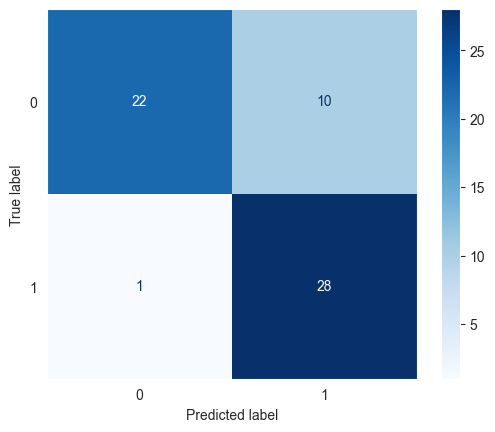

In [837]:
# Confusion matrix
sns.set_style({'axes.grid': False})
cm = confusion_matrix(concatenated_df.label, y_pred_imp_fix)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,)
disp.plot(cmap='Blues')
plt.show()

Based on the evaluation, it appears that the model we have trained has a tendency to :
- Took around 60-70 seconds per epoch to train, which is a huge improvement from the two previous models. 
- The model tends to fit not very well, has uneven gradient loss, and has some exploding gradient. 
- Have a train binary accuracy of 99%, and test accuracy of 81%. The model is very much overfit. 
- Have a the highest recall score on category '1' (AI-Generated).

Based on these information, lets try to evaluate the next model by:
- `Reducing` either architecture, augmentation, or other added optimizer that has added the complexity of the model's architecture since the model has the tendency to overfit.
- Try default setting.
- Try different optimizer. 

## 4) Sequential - Improved

Explanation behind the architecture:

- Neurons: The consideration of the number of neurons remains the same as in the previous model.
- The consideration for convolutional layer are still the same as the previous model.
- Input shape, activation used, optimizer used, and metrics are used for the same reason as the prior model.
- Using 0.6 threshold to maximize recall score. 
- Remove BatchNormalization

### Model Definition

In [665]:
# clear session
tf.keras.backend.clear_session()

In [666]:
# perform sequential model
model_sequential = Sequential([
    layers.Rescaling(1./255, input_shape=inputs),
    layers.Conv2D(16, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dense(units=1, activation='sigmoid')
])

model_sequential.compile(optimizer='adam', loss='binary_crossentropy',
            metrics = [tf.keras.metrics.BinaryAccuracy(threshold = .6), tf.keras.metrics.Recall(), tf.keras.metrics.Precision()]) 

In [667]:
# looking at model summary
model_sequential.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, 128, 128, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 128, 128, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 64, 64, 16)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 64, 64, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 32, 32, 32)       0         
 2D)                                                             
                                                                 
 flatten (Flatten)           (None, 32768)             0

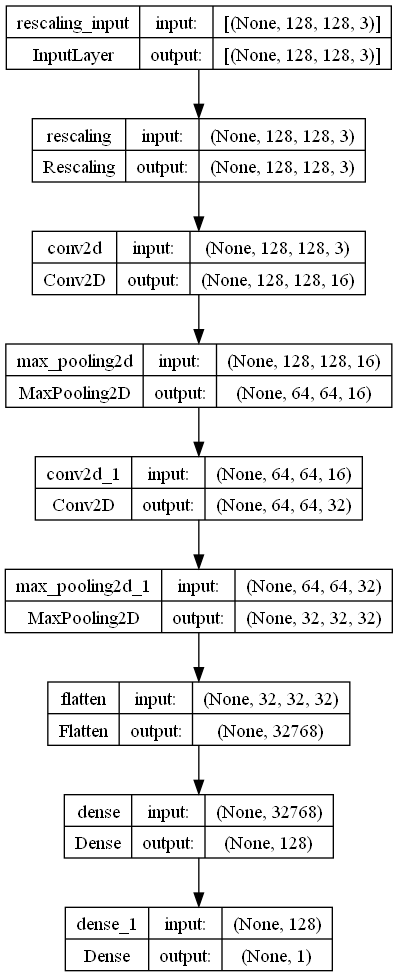

In [509]:
# plot layers
tf.keras.utils.plot_model(model_sequential, show_shapes = True)

In [510]:
# train the model
epochs= 20
history_ms= model_sequential.fit(
    train_ds_pipe,
    validation_data= val_ds_pipe,
    epochs=epochs,
    callbacks = cb_esmc
)

Epoch 1/20
26/26 [==============================] - 77s 3s/step - loss: 1.0481 - binary_accuracy: 0.6263 - recall: 0.6951 - precision: 0.6592 - val_loss: 0.2755 - val_binary_accuracy: 0.8055 - val_recall: 0.8899 - val_precision: 1.0000
Epoch 2/20
26/26 [==============================] - 74s 3s/step - loss: 0.3688 - binary_accuracy: 0.8253 - recall: 0.7908 - precision: 0.8786 - val_loss: 0.2520 - val_binary_accuracy: 0.8029 - val_recall: 0.8459 - val_precision: 1.0000
Epoch 3/20
26/26 [==============================] - 74s 3s/step - loss: 0.2850 - binary_accuracy: 0.8681 - recall: 0.8247 - precision: 0.9384 - val_loss: 0.2396 - val_binary_accuracy: 0.8254 - val_recall: 0.8619 - val_precision: 1.0000
Epoch 4/20
26/26 [==============================] - 75s 3s/step - loss: 0.2482 - binary_accuracy: 0.8866 - recall: 0.8557 - precision: 0.9457 - val_loss: 0.2522 - val_binary_accuracy: 0.8259 - val_recall: 0.8599 - val_precision: 1.0000
Epoch 5/20
26/26 [==============================] - 74s 

### Model Evaluation

In [511]:
# create dataframe out of training history
history_ms_df = pd.DataFrame(history_ms.history)
# look through the lasts histories
history_ms_df.tail(5)

,loss,binary_accuracy,recall,precision,val_loss,val_binary_accuracy,val_recall,val_precision
15,0.062147,0.978445,0.976900,0.989848,0.179343,0.922939,0.935333,1.0
16,0.067449,0.975289,0.973838,0.986746,0.160329,0.932280,0.943057,1.0
17,0.048021,0.985527,0.983440,0.995773,0.110494,0.954733,0.961020,1.0
18,0.052874,0.982294,0.980518,0.992954,0.153423,0.941081,0.947728,1.0
19,0.037017,0.990146,0.989702,0.996358,0.121950,0.955092,0.962457,1.0


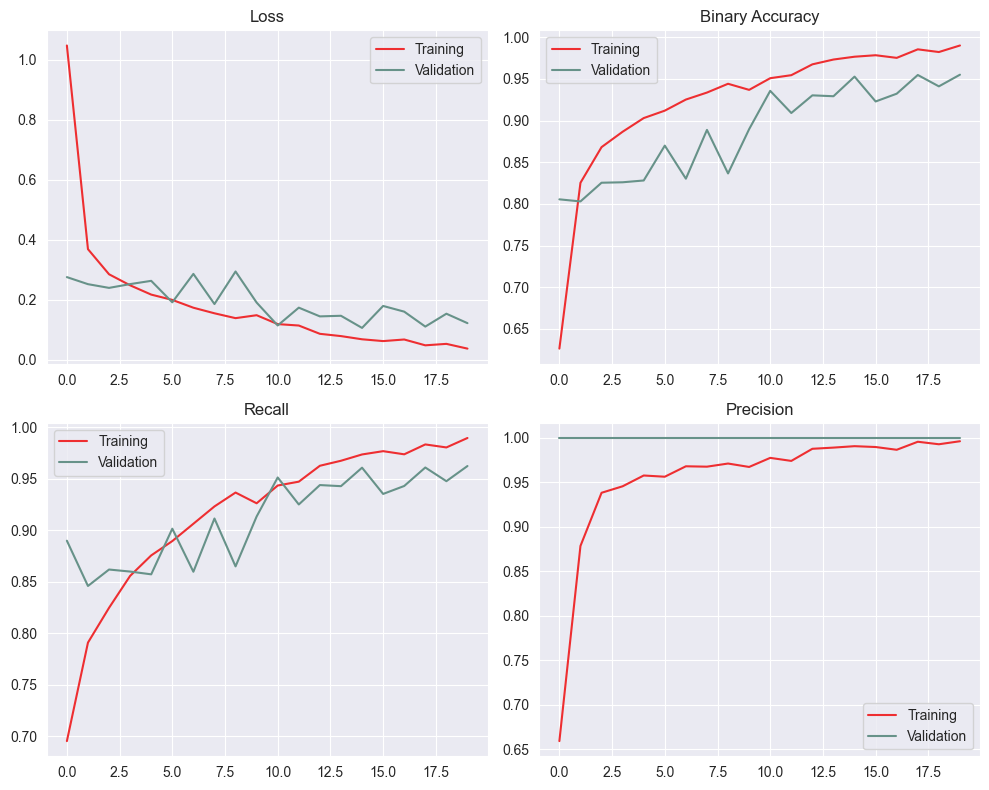

In [512]:
# making 2 by 2 canvas
sns.set_style({'axes.grid': True}) # using grid for better and easier visual
sns.set_style('darkgrid')
fig, axes = plt.subplots(2, 2, figsize=(10, 8))

# loss
axes[0, 0].plot(history_ms_df['loss'], color = '#ee2e31')
axes[0, 0].plot(history_ms_df['val_loss'], color = '#679289')
axes[0, 0].set_title('Loss')
axes[0, 0].legend(['Training', 'Validation'])

# binary accuracy
axes[0, 1].plot(history_ms_df['binary_accuracy'],color = '#ee2e31')
axes[0, 1].plot(history_ms_df['val_binary_accuracy'],color = '#679289')
axes[0, 1].set_title('Binary Accuracy')
axes[0, 1].legend(['Training', 'Validation'])

# Recall
axes[1, 0].plot(history_ms_df['recall'],color = '#ee2e31')
axes[1, 0].plot(history_ms_df['val_recall'],color = '#679289')
axes[1, 0].set_title('Recall')
axes[1, 0].legend(['Training', 'Validation'])

# Precision
axes[1, 1].plot(history_ms_df['precision'],color = '#ee2e31')
axes[1, 1].plot(history_ms_df['val_precision'],color = '#679289')
axes[1, 1].set_title('Precision')
axes[1, 1].legend(['Training', 'Validation'])

# show plot
plt.tight_layout()
plt.show()

In [671]:
# evaluation
test_results_seq = model_sequential.evaluate(test_ds, verbose=0)
print(f'Test Loss     : {test_results_seq[0]:.4f}')
print(f'Test Accuracy : {test_results_seq[1]:.4f}')

Test Loss     : 0.2473
Test Accuracy : 0.9180


In [804]:
# see its classification report
y_pred_seq = model_sequential.predict(test_ds)
y_pred_seq_fix = np.where(y_pred_seq >=0.6, 1,0 )
print(classification_report(concatenated_df.label, y_pred_seq_fix))

              precision    recall  f1-score   support

           0       0.86      1.00      0.93        32
           1       1.00      0.83      0.91        29

    accuracy                           0.92        61
   macro avg       0.93      0.91      0.92        61
weighted avg       0.93      0.92      0.92        61



Based on the evaluation, it appears that the model we have trained has a tendency to :
- Took around 70-80 seconds per epoch to train, which isn't the best but yieldly improved compared to the first two models. 
- The model tends to not fit very well, has uneven gradient loss, and has some exploding gradient. 
- Have a train binary accuracy of 99%, and test accuracy of 92%. The model tends to overfit. 
- Have a lower recall score (83%) compared to other metrics, and is also lower compared to the previous model that implemented BatchNormalization (recall score of 97%)

Even though the recall score is lower than the previous model, the overall performance of the model has significantly improved. We attempted to apply batch normalization in every layer, even reducing it to just one batch, but it resulted in poor performance (perhaps we were not using it right, or the type of normalization is not very suitable for this data. We could try other normalization that might fit the data better). Surprisingly, the default model provided the best results among all variations. While recall score is crucial to avoid misclassifying AI-generated art as human, `we also recognize the importance of overall performance`, as incorrectly predicting human art as AI-generated can have negative implications for the art community. Therefore, we plan to conduct further evaluations on `this model` and utilize it for deployment.

# VII. Further Evaluation

### Parameter

In this section, we will try to break down the parameter that works, and attempt to uncover insights as to `why` they contribute to better results. From our previious model-making, it is observed that the simplest sequential model has performed the best among other tested models. Other than its metrics, this model also exhibits improved gradient loss compared to the other models. The effective management of gradient loss in this model indicates a better overall stability and generalization, leading to presumably more reliable predictions for inferential data.

**Uniqueness in Batch Normalization Results**

We did encounter a unique observation in our experiments where the model with BatchNormalization introduced issues with exploding gradients in its validation loss metric. This unexpected behavior suggests that the inclusion of BatchNormalization in this particular model may have affected the stability of gradient updates during training. 

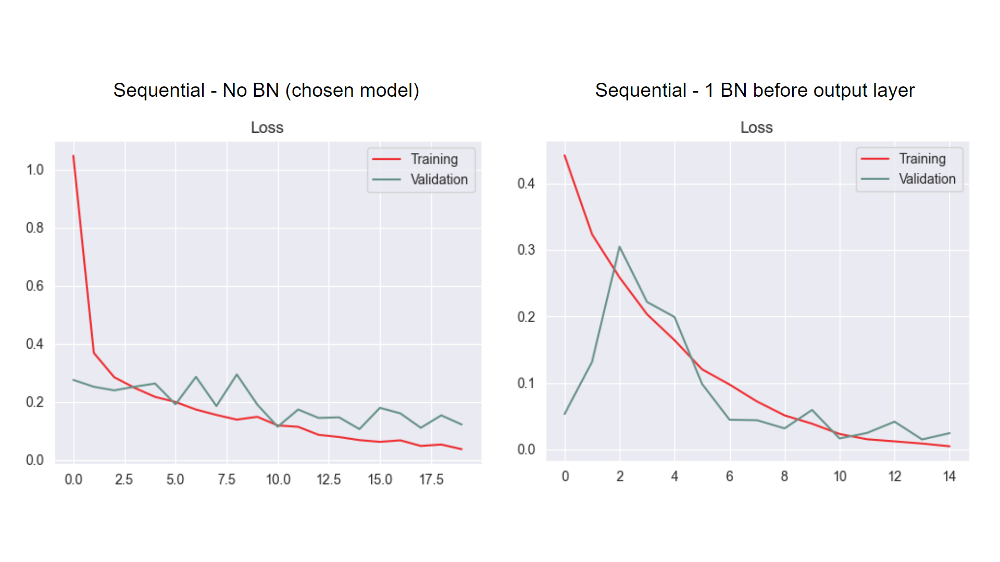



We also have tried to improve the order of use, based on the advice from [stackexchange.com](https://datascience.stackexchange.com/questions/93316/poor-cnn-performance-after-implementing-batchnormalization) to put Batch Normalization after every convolutional layer, and have implemented these architecture:


```py
model_seq = Sequential([
    layers.Rescaling(1./255, input_shape=inputs),
    layers.Conv2D(16, 3, padding='same', activation='relu'),
    layers.BatchNormalization(),  
    layers.MaxPooling2D(),
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.BatchNormalization(),  # put batchnorm after every convo
    layers.MaxPooling2D(),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.BatchNormalization(),  
    layers.Dense(units=1, activation='sigmoid')
])
```

But the model performance gotten worse. From what we know of, Batch Normalization normalizes the output of the previous output layer by subtracting the mean over the batch divided by the empirical standard deviation--in other words, re-centering and re-scalling (Ioffe, Sergey; Szegedy, Christian (2015)). We have found some possible explanations through our research as to why this "explosion" could happen even with Batch Normalization:

- Batch Normalization operation aims to address this issue by normalizing the output of each layer. However, computing the mean and standard deviation on the entire dataset can be computationally costly. Therefore, these statistics are typically estimated based on a batch of data. This can lead to a problem where the mean and standard deviation of Batch Normalization `never stabilizes`, resulting in higher validation loss even if the training loss converges to a certain value.

- Instability with small batch sizes: The statistical estimation (when calculatng the mean, std, etc) tends to be more accurate with larger batch sizes but becomes less reliable as the batch size decreases. Consequently, when using small batch sizes, the instability in estimating mean and variance can contribute to gradient explosions or other issues in the model.

- Wrong placement and wrong assumptions in using Batch Normalization. We can try to use other normalization or do other experiments in putting them at the right order. 

(source: [mindee.com](https://mindee.com/blog/batch-normalization/), [Towards Data Science: Curse of Batch Normalization](https://towardsdatascience.com/curse-of-batch-normalization-8e6dd20bc304#:~:text=Due%20to%20the%20change%20of,data%2C%20which%20eventually%20hurts%20performance.))

**Simplest model**

Turns out, it's not the augmented model, transfer learning, nor other approaches that give us a satisfactory results. The simplest model gave us the highest accuracy. Here's our opinion on this:

- Not Transfer Learning: It appears that our initial assumptions about transfer learning might be incorrect; it may not have been a suitable approach for our specific dataset. Additionally, we didn't perform any fine-tuning, which could have potentially improved the results. However, we decided not to pursue fine-tuning due to the time it would take.

- Not augmented model: We decided against using an augmented model because augmenting the data could introduce bias, making AI-generated art appear more human-like and human art appear more AI-generated. We wanted to preserve the originality of our data and avoid such biases.

- Simplicity: It seems that the simplicity of the model played a significant role. In our case, a simpler model proved to be more effective. We did, however, include 128 neurons in each layer, which is a relatively high number--that also might be a reason it balanced out more effectively on the simplest architecture. Simplicity reduces computational requirements;erhaps it allows the model to generalize well to unseen data, resulting in improved accuracy.

### Confusion Evaluation

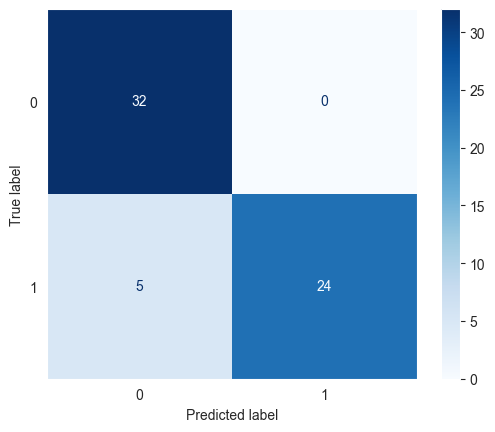

In [805]:
# Confusion matrix
sns.set_style({'axes.grid': False})
cm = confusion_matrix(concatenated_df.label, y_pred_seq_fix)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,)
disp.plot(cmap='Blues')
plt.show()

Previously, it was known that the model tends to overfit. From the evaluation results, it can be seen that the data has an accuracy of 92%, recall of 83%, and true precision of 100%. Here is an explanation regarding these results:

- Out of 29 AI-generated art, there are still 5 of them predicted as human art. False negative predictions can lead to serious consequences, such as in art competitions or curation where authenticity is considered crucial. This can cause the company to accept fraud as the winner, and they may also suffer losses if they hire incompetent artists. However, in real-world scenarios, curators should be able to examine each artwork individually. Therefore, these metrics are more important in `handling bulk data` (detecting AI art from thousands of data points) rather than assessing individual pieces (which would undergo stricter screening).
Another concern we addressed in the introduction is the art community's frustration with art theft, where AI models are trained using artists' original artwork. This practice can lead to confusion among artists and art enthusiasts, as buyers may commission artwork expecting an authentic human-made piece but end up receiving AI-generated art instead. This situation can undermine the integrity and value of original artwork, causing dissatisfaction and disappointment among buyers. It is important to address these concerns and ensure transparency in the creation and distribution of art to maintain the trust and authenticity within the art community.

- On the other hand, all 32 human-made art were successfully predicted as human-made. This indicates that the model tends to predict human art slightly better than AI art. However, if there are false positive predictions (human art predicted as AI) during data inference experiments, it can still lead to significant consequences and potentially `offend the art community`. Failing to predict human-made as AI can also give loss in both material and efforts. So we consider this metrics as important as the other metrics (recall).

In this case, our model have `failed to maximize the recall value`. However, we also need a good precision and overall value--with the consideration that both false positives and negatives can cause damage to the community, `both financially and ethically`. Overall, the model tends to perform better in predicting human-made artworks, especially in traditional art. Though, we do not recommend using the model to predict AI-generated art, especially those that are `highly advanced` (newer version AI) and appear to be "hand-drawn". It is also important to note that the provided test data is limited (a total of 61 images), which may lead to limitations in conducting a more comprehensive model evaluation.

### Mistaken Analysis

In this section, we will conduct an analysis to determine the data that the model tends to predict incorrectly.

In [811]:
# making dataframe of actual and predicted label
y_pred_ravel = y_pred_seq_fix.ravel()  # turn one dimensional
model_result = pd.DataFrame({'label (pred)': y_pred_ravel})
model_results = pd.concat([concatenated_df, model_result], axis=1)

In [812]:
print('Actual:',model_results['label'].sum())
print('Pred:',model_results['label (pred)'].sum())

Actual: 29
Pred: 24


It is observed that there are differences between the actual and predicted values, and the total number of predictions is lower than the actual count. This indicates that the model tends to perform better in predicting human-made art. Now, let's examine specifically which images does this model tends to fail.

In [815]:
# filter dataset by difference
model_results[model_results['label'] - model_results['label (pred)'] == 1]

,id,label,label (pred)
32,C:\Users\Dissa Shafira\Hacktiv8_main\Phase 2 M...,1,0
40,C:\Users\Dissa Shafira\Hacktiv8_main\Phase 2 M...,1,0
42,C:\Users\Dissa Shafira\Hacktiv8_main\Phase 2 M...,1,0
46,C:\Users\Dissa Shafira\Hacktiv8_main\Phase 2 M...,1,0
51,C:\Users\Dissa Shafira\Hacktiv8_main\Phase 2 M...,1,0


In [819]:
# got the index, turn into a list
fail_indices = [32, 40, 42, 46, 51]
fail_id = list(model_results.loc[fail_indices, 'id'])
fail_id

['C:\\Users\\Dissa Shafira\\Hacktiv8_main\\Phase 2 Milestone 2\\aidata\\test\\1\\0.jpg',
 'C:\\Users\\Dissa Shafira\\Hacktiv8_main\\Phase 2 Milestone 2\\aidata\\test\\1\\10007.jpg',
 'C:\\Users\\Dissa Shafira\\Hacktiv8_main\\Phase 2 Milestone 2\\aidata\\test\\1\\10009.jpg',
 'C:\\Users\\Dissa Shafira\\Hacktiv8_main\\Phase 2 Milestone 2\\aidata\\test\\1\\10017.jpg',
 'C:\\Users\\Dissa Shafira\\Hacktiv8_main\\Phase 2 Milestone 2\\aidata\\test\\1\\10028.jpg']

**False Negatives Error**

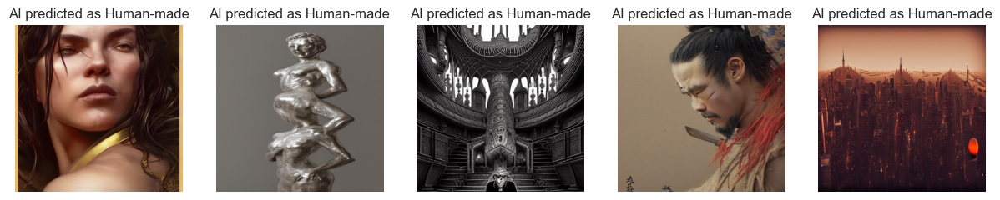

In [824]:
# look at failed predictions
visualize_5(fail_id, labels = 'AI predicted as Human-made')

The model tends to struggle in predicting certain types of data. This could be due to several reasons:

1. `Composition`: The data that the model fails to predict correctly often exhibits a specific composition, such as; being centered, symmetrical, following the rule of thirds, or arranged in a grid pattern.

2. `Color Palette`: In contrast to other AI-generated art, these particular data samples have duller colors. Instead of vibrant and saturated colors, they tend to have more realistic tones like greys and browns/nudes. That could be the indicator since our human-made training dataset contrains some traditional art that is colored in duller colors. 

3. `Photographic Appearance`: The model may have difficulty distinguishing between images that resemble photographs rather than paintings. These images might lack the characteristic brushstrokes and artistic style commonly found in AI-generated art--thus, makes them looked more like the characteristic of a human-art by this model's calculations.

Please note that these observations are based on assumptions and further analysis would be required for a more comprehensive understanding.



**False Positives Error**

Other then that, not included in this notebook, we also conducted experiments onn the [model deployment](https://huggingface.co/spaces/Dissashaf/ai-or-human). It was observed that the model tended to predict certain examples of human art as AI-generated, such as these type of images:

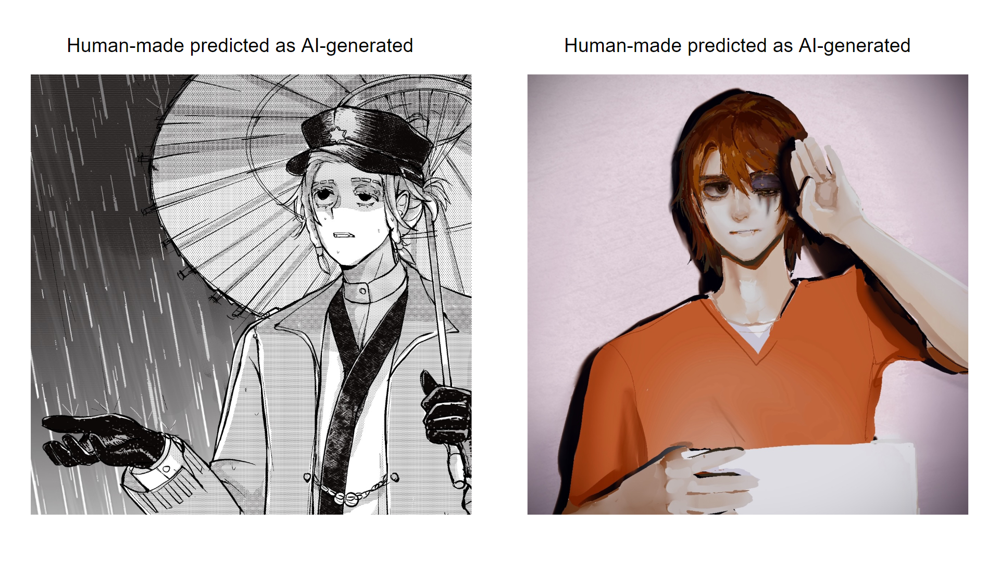

This could be attributed to the following reasons:
1. `Advancements` in AI-generated art: AI-generated art has evolved and become more realistic over time. The model used in this analysis was trained with AI-generated data up until January 2023, and there may have been significant advancements in AI art since then. The model might struggle to differentiate between modern-looking (cartoonish) human art and AI-generated art due to this differences in training data.

2. `Copyright considerations`: The human art included in the dataset predominantly consists of old paintings and historical artwork. The model's tendency to misclassify "modern-looking" human art as AI-generated could be attributed to the absence of such contemporary artworks in the training set. On the other hand, human-made art with distinctive brushstrokes or famous paintings like the Mona Lisa or Starry Night, which were not part of the training set, are likely to be predicted accurately.

3. Difficulty with `digital art`: The model also exhibited poorer performance in predicting digital art. This could be due to the broader range of colors typically found in digital art, including shades of white and black that may not exist in real life. Additionally, the dataset used for training may not have included a sufficient representation of human-made digital art, causing the model to misclassify digital art as AI-generated (explained more in the conclusion section).

It's important to note that these observations are based on the assumptions made and further investigation is recommended for a deeper understanding of the model's behavior.

# VIII. Model Saving

In [517]:
# saving the best model
model_sequential.save('model_sequential_ai.h5') 

# IX. Conclusion

### Conclusion

**1. Data Exploration:**

From the previous exploration, we have gotten some conclusion such as:

- Compiling period: The dataset used were compiled until January, and it is possible that AI-generated art has further advanced since then.
- Style: Traditional human-made art tends to be either realistic or abstract. In contrast, AI-generated art often combines both styles, incorporating noises and creating unique and unconventional images.
- Colors: Hue does not play a significant role in determining which is which. However, saturation does play a significant role as AI-generated images tend to have a broader color palette that may not be present in traditional drawings. 
- Composition: AI art often lacks centered composition and a clear focal point, distinguishing it from traditional art forms.


**2. Model Analysis:**
- The simplest model worked best in our case, likely due to the complexity of the data. Sequential model might be suitable because it reduces computation, makes the model's decision-making process easier, and allows it to capture important information more effectively. We intentionally avoided manipulating our dataset through data augmentation as it could introduce bias and potentially misclassify human art as AI-generated and vice versa.

- The model exhibited better gradient behavior compared to other models, both in terms of the gradient path (not extremely exploding) and the balance between the validation and training sets; it didn't show signs of extreme overfitting or extreme underfitting.

- Although the model had a lower recall score, its overall performance was higher. We considered all metrics important and decided to prioritize the model's overall performance rather than focusing solely on recall.

- The average training time of the model was reasonable and effective compared to other models.


**3. Model on Domain:**

The model lacks on one of the most important measure, which was one of our initial goal, that is to minimize False Negatives and maximizes its recall score. However, despite this limitation, we have chosen to use this model due to its better overall performance. We believe that considering `both false positives and false negatives` is important in our domain. Furthermore, if a higher recall score is preferred, we have another model with a 97% recall score that can still be accessed.

In summary, our model demonstrates a tendency to predict human-made art more accurately than AI-generated art, which is beneficial for the art community. However, the model may struggle to predict advanced AI-generated art (as the dataset only extends until January 2023) and may also struggle with predicting digital human-made art.


**4. Further improvement:**

- We can update the training set by including advanced AI-generated art produced up to the current date and a broader range of human-made art that includes digital art and various artistic styles. However, acquiring consent from artists for the human dataset part may pose a significant challenge, particularly from those who are still alive.
- We can experiment with different optimizers, architectures, and normalization techniques to improve the model's performance. For instance, we can consider improving our BatchNormalization model that has a better recall result by exploring other architecture and optimizers.
- Utilizing different transfer learning approaches, fine-tuning them, and increasing the number of epochs if additional time permits. This could potentially enhance the model's capabilities.
- As stated at the beginning of section VI, we can try a different approach that aim more to "detect artificial behaviour" using a generative model (that has a discriminator) rather than detecting both classifications differences only by their **visual features**. This project comes as an exploration so we still got a lot to learn and explore deeper.


### Worries


In the spirit of transparency, we acknowledge certain concerns regarding the model's ability to make determinations that go beyond its intended purpose. We are mindful of the following worries that the model could be prone to be:

- Aesthetic period determination: There is a possibility that the model may lean more towards identifying the aesthetic period or style of an artwork rather than distinguishing between AI-generated and human-made art. This could result in the model focusing on characteristics specific to `certain art movements` rather than accurately identifying the origin of the artwork.

- Differentiating traditional and digital art: There is a possibility that the model may also lean to classifying digital and traditional art, rather than AI or not. Factors such as color range, texture, and other stylistic elements could influence the model's predictions. `The limited representation of human-made digital art in the training data` may also contribute to the model's difficulty in correctly classifying such artworks.

- Subjective judgments of "good" and "bad" art: Lastly, and what we are most afraid of, is for us and the model to unintentionally limit personal artistic choices. We want to emphasize that our goal is not to pass judgment on the quality or artistic traits of any artwork. It is possible that the model may mistakenly associate certain artistic styles or characteristics with AI-generated art. For example, as we described earlier about AI-generated has a tendency to look "smeared and lack of focal points"; we want to emphasize that our intention is not to impose limitations on artistic expression or dictate how art should or should not look. Art is a diverse and subjective form of creative expression, encompassing a wide range of styles, genres, and techniques. We recognize and celebrate the ability of art to be surreal, experimental, and a fusion of various styles. 

It is essential to approach the model's predictions with caution and consider them as one of many tools for analysis and exploration. The model's predictions should be considered as `one perspective among many`, and they should not be used as the sole determinant of artistic value or quality. Our intention is to create a collaborative environment where both AI engineers and artists can learn and improve together, respecting the diverse possibilities and expressions within the art world.